<a href="https://colab.research.google.com/github/GiX007/image-analysis-and-processing/blob/main/classic_image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Analysis and Processing Exercises

This notebook contains fully implemented and documented solutions for a set of fundamental image processing exercises:

  *   Intensity Transformations with a Step Function
  *   Brightness and Color Enhancement
  *   Contrast Adjustment with Gamma Correction
  *   Image Sharpening
  *   Spatial Enhancement Pipelines
  *   Edge and Corner Detection
  *   Angle Estimation and Image Generation

Each section includes input/output images, clear Python code using OpenCV and NumPy, and detailed explanations of what, why, and how each step is performed.

## Exercise 1. Applying a Step Function to a Grayscale Image

In the first exercise, we are going to apply the following ```step transformation function``` to a grayscale image.

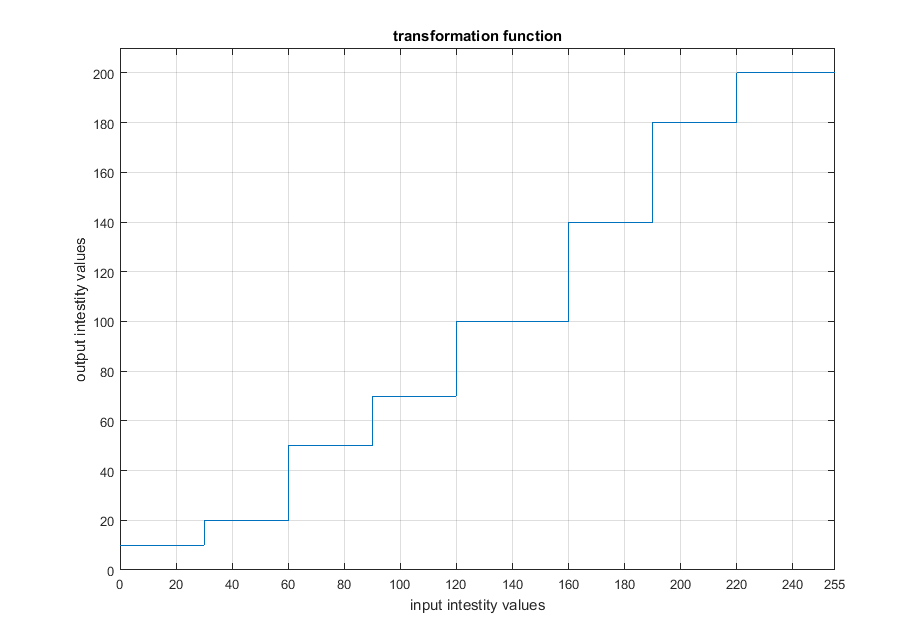

### 1.1. Explanation of the Transformation Function

The transformation we will apply is a step function, which divides the full range of grayscale intensity values $(0-255)$ into several distinct intervals/bins. Each bin is mapped to a fixed output intensity. For example, input values between $0$ and $30$ are all mapped to $10$, values between $30$ and $60$ to $20$, and so on. This creates discrete jumps in brightness, where large areas have the same uniform intensity.

About the result:

  *   **Intensity values**: The original image usually contains a wide range of pixel values, allowing for smooth changes in brightness. After applying the step function, the number of unique intensity levels is drastically reduced, so neighboring pixels that previously had small intensity differences now take on the same value. This results in broad regions of uniform intensity with sharp transitions between them.

  *   **Brightness**: While the average brightness may stay similar, the image now has large areas of flat brightness and clear edges between regions of different intensities. This enhances certain features, such as edges and boundaries, but removes fine details, making the image look more like a simplified diagram or a segmented map.

So, we expect for the output image to be much less detailed, with fewer grayscale levels and an overall appearance where regions of similar brightness are grouped together.

### 1.2. Applying the Transformation

We will now apply the step transformation function to a grayscale image to observe its practical effect. This will help us verify how the function alters the pixel intensity values and affects the visual appearance of the image. Specifically, we'll check how smooth changes in brightness in the original image are replaced by regions with uniform brightness according to the step intervals.

Let's start by loading an image from our [dataset](https://github.com/GiX007/image-analysis-and-processing/tree/main/data), displaying and exploring it. This image will be used as input to the step transformation function.

In [ ]:
# useful imports
import cv2
import numpy as np
import matplotlib.pyplot as plt

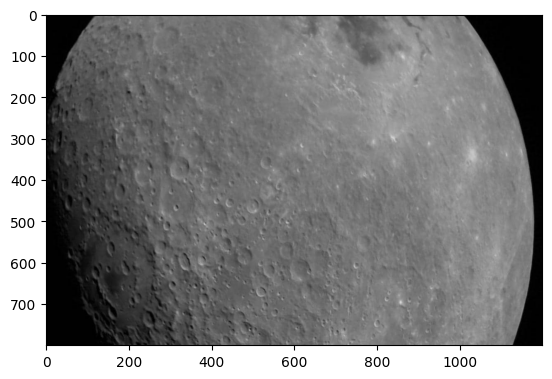

In [ ]:
# load an image
img_0 = cv2.imread('First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg')

# display the image
plt.imshow(img_0)
plt.show()

In [ ]:
# define a helper function to explore basic image information
def print_image_info(img):
  """ Prints information about an image (grayscale or RGB). """

  # display basic information about an image
  print(f'Image shape (height, width{", channels" if img.ndim == 3 else ""}): {img.shape}')
  print(f'Number of dimensions: {img.ndim}')  # 2 for grayscale, 3 for color
  if img.ndim == 2:
    print("Image type: Grayscale")
  elif img.ndim == 3:
    print("Image type: RGB")
  print(f'Total number of elements (pixels x channels): {img.size}')
  print(f'Data type of pixel values: {img.dtype}')  # usually uint8
  print(f'Type of image object: {type(img)}')  # <class 'numpy.ndarray'> for cv2.imread

  # pixel intensity statistics
  print(f'\nMinimum pixel value: {img.min()}')
  print(f'Maximum pixel value: {img.max()}')
  print(f'Mean pixel value: {round(img.mean(), 2)}')
  print(f'Standard deviation of pixel values: {round(img.std(), 2)}')
  print(f'Number of unique pixel values: {np.unique(img).size}') # unique pixel values

In [ ]:
# print image's info
print_image_info(img_0)

Image shape (height, width, channels): (800, 1200, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 2880000
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 218
Mean pixel value: 101.81
Standard deviation of pixel values: 43.15
Number of unique pixel values: 218


As we can see, the image of the moon is in RGB format, so we first need to convert it to grayscale before applying the step transformation function.

In [ ]:
# convert the image to grayscale and print info
img_1 = cv2.cvtColor(img_0, cv2.COLOR_BGR2GRAY)
print_image_info(img_1)

Image shape (height, width): (800, 1200)
Number of dimensions: 2
Image type: Grayscale
Total number of elements (pixels x channels): 960000
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 218
Mean pixel value: 101.81
Standard deviation of pixel values: 43.15
Number of unique pixel values: 218


In [ ]:
# let's see how the image looks like in reality
print(img_1) # all pixels
print('\n', img_1[:10, :10]) # top-left 10x10 pixel block
print('\n', img_1[-10:, -10:]) # bottom-right 10x10 pixel block
print('\n', img_1[400:410, 600:610]) # middle 10x10 pixel block
print('\n', img_1[400:410, 1000:1010]) # mid-right 10x10 pixel block

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]

 [[1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]]

 [[1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]]

 [[ 98  98  97  95  95  98 104 108 107 110]
 [101 101  99  97  96  98 103 107 106 110]
 [105 105 103 100  98  98 102 105 106 109]
 [109 109 107 104 101 100 102 104 107 109]
 [111 112 111 108 104 102 103 104 108 109]
 [112 113 113 111 107 105 105 106 110 111]
 [111 113 114 113 110 108 108 109 112 112]
 [110 113 115 114 112 110 110 111 114 113]
 [108 114 120 121 116 112 111 112 111 117]
 [107 113 119 119 116 112

When inspecting the top-left and bottom-right $10 x 10$ pixel blocks, we observe that most values are close to $1$, which explains the dark appearance in those regions.
In contrast, the central area of the image has pixel values around $100$, resulting in a lighter surface (the moon) due to higher intensity.

Let's now create the step transformation function and apply the above image into it.

In [ ]:
# step transformation function
def step_function(img):
  """ Applies the given step function to an image and returns the transformed image. """

  # prepare the output
  numRows = img.shape[0]
  numCols = img.shape[1]
  img_out = np.zeros((numRows, numCols), dtype=np.uint8)

  # apply the step function (simplests way)
  for row in range(numRows):
    for col in range(numCols):
      val = img[row, col]
      if 0 <= val < 30:
        img_out[row, col] = 10
      elif 30 <= val < 60:
        img_out[row, col] = 20
      elif 60 <= val < 90:
        img_out[row, col] = 50
      elif 90 <= val < 120:
        img_out[row, col] = 70
      elif 120 <= val < 160:
        img_out[row, col] = 100
      elif 160 <= val < 190:
        img_out[row, col] = 140
      elif 190 <= val < 220:
        img_out[row, col] = 180
      elif 220 <= val <= 255:
        img_out[row, col] = 200
      else:
        img_out[row, col] = 0

  return img_out

In [ ]:
# apply the function to the image
img_1_trsf = step_function(img_1)

In [ ]:
# let's see some info about the transformed image now
print_image_info(img_1_trsf)

Image shape (height, width): (800, 1200)
Number of dimensions: 2
Image type: Grayscale
Total number of elements (pixels x channels): 960000
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 10
Maximum pixel value: 180
Mean pixel value: 71.85
Standard deviation of pixel values: 31.42
Number of unique pixel values: 7


In [ ]:
# let's see now at how the transformed image looks like in reality in the same sample pixel blocks
# print(I_transformed_1) # all pixels
print('\n', img_1_trsf[:10, :10]) # top-left 10x10 pixel block
print('\n', img_1_trsf[-10:, -10:]) # bottom-right 10x10 pixel block
print('\n', img_1_trsf[400:410, 600:610]) # middle 10x10 pixel block
print('\n', img_1_trsf[400:410, 1000:1010]) # mid-right 10x10 pixel block


 [[10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]]

 [[10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]
 [10 10 10 10 10 10 10 10 10 10]]

 [[ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  70  70  70]
 [ 70  70  70  70  70  70  70  

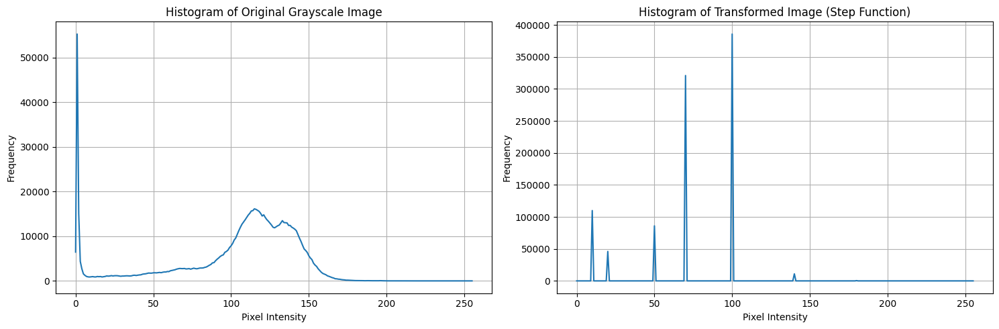

In [ ]:
# compute histograms before and after transformation
hist_original = cv2.calcHist([img_1], [0], None, [256], [0, 256])
hist_transformed = cv2.calcHist([img_1_trsf], [0], None, [256], [0, 256])

# create side-by-side plots
plt.figure(figsize=(15, 5))

# original histogram
plt.subplot(1, 2, 1)
plt.plot(hist_original)
plt.title('Histogram of Original Grayscale Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)

# transformed histogram
plt.subplot(1, 2, 2)
plt.plot(hist_transformed)
plt.title('Histogram of Transformed Image (Step Function)')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

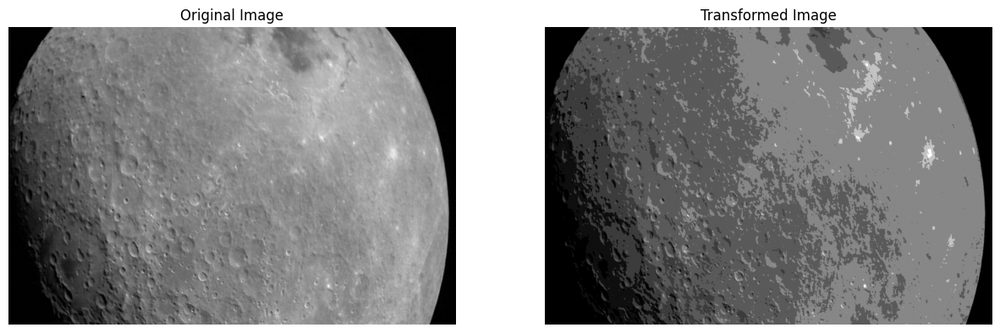

In [ ]:
# display the result with the original image next to its transformed one

# original image
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_1, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# transformed image
plt.subplot(1, 2, 2)
plt.imshow(img_1_trsf, cmap='gray')
plt.title('Transformed Image')
plt.axis('off')
plt.show()

The transformation step function, as we have already mentioned above, maps input intensity values to some discrete output ones, and especially, reduces the number of different pixel intensity values in the image. In the original image, there are many unique intensity values $(218)$, so the brightness, which is directly related to pixel intensity, changes smoothly across the surface, and each pixel can be slightly different from its neighbor. In the transformed image, only a few intensity levels are used $(7)$, so large areas share the same brightness, and we observe sudden jumps between regions. By examining the histograms of the original and transformed images, we confirm this reduction of unique intensity levels, with the original histogram showing a continuous distribution of pixel intensities and the transformed histogram exhibiting discrete peaks corresponding to the step function's output ranges. This makes the image look less natural and more like a map or drawing, with clear and separated zones that help us see the moon's features more easily.

## Exercise 2. Enhancing Light and Color of a RGB Image

In this exercise, we are going to improve the visibility of a RGB image, in terms of **perceived brightness and color**, making the details more visible without distorting the natural appearance. We will explore both grayscale and color-based enhancement techniques, starting with histogram equalization and then applying ```CLAHE``` function to improve both contrast and color balance.

Let's start again by loading a rgb image, displaying and exploring it.

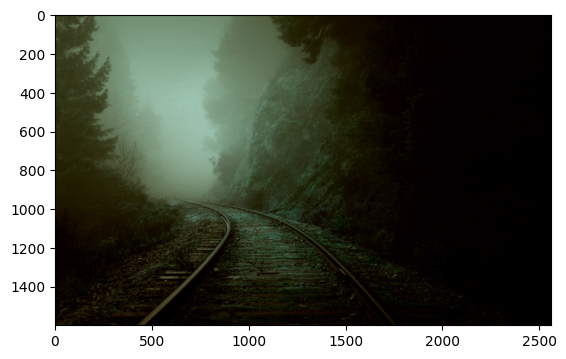

In [ ]:
# load a rgb image sample
img_2 = cv2.imread('nature_dark_forest.jpg')

# display the image
plt.imshow(img_2)
plt.show()

In [ ]:
# explore the image
print_image_info(img_2)

Image shape (height, width, channels): (1600, 2560, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 12288000
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 198
Mean pixel value: 37.18
Standard deviation of pixel values: 49.35
Number of unique pixel values: 199


In [ ]:
# let's see how the image looks like in reality
print(img_2)

[[[57 62 33]
  [57 62 33]
  [57 62 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 61 32]
  [57 62 33]
  [57 62 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 61 32]
  [57 62 33]
  [58 63 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[20  9  1]
  [19  9  0]
  [20 11  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 12  2]
  [25 13  1]
  [26 16  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[31 19  7]
  [32 21  7]
  [37 24  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]


As we can see, the RGB image appears dark in most areas, so let's examine how the pixel intensity values are distributed across each color channel by plotting their histograms.

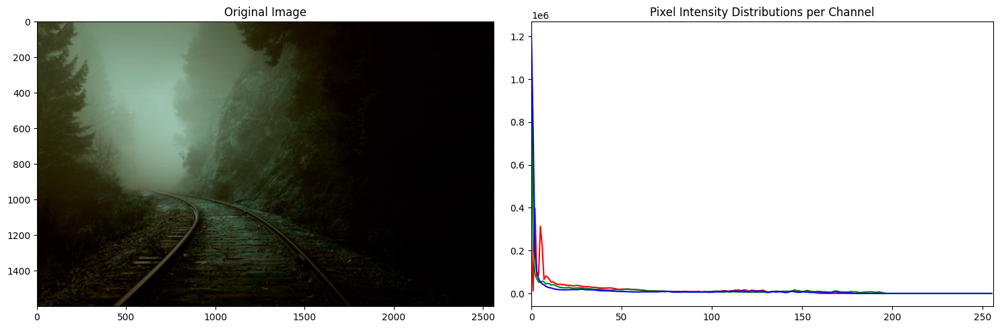

In [ ]:
# display the original image
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_2)
plt.title('Original Image')

# display pixel intensity distributions per channel
plt.subplot(1, 2, 2)
colors = ('r', 'g', 'b')
for i, color in enumerate(colors):
  hist = np.bincount(img_2[:, :, i].ravel(), minlength=256)
  plt.plot(hist, color=color)

plt.title('Pixel Intensity Distributions per Channel')
plt.xlim([0, 256])
plt.tight_layout()
plt.show()

Generally, each pixel in a digital color image is formed by blending red, green, and blue (RGB) components, each ranging from 0 to 255 in brightness for 8-bit images. A histogram for each channel shows how many pixels fall into each intensity level and reflects the overall light distribution in the scene.

Let's first try to improve **only** the image's brightness.

In our case, the histograms show that most pixel values are concentrated in the low brightness region, confirming our initial observation. The intensity values are clustered near 0 across all three RGB channels, indicating that the image is mainly dark, as lower intensity values correspond to darker shades.

Although there's no single "ideal" histogram for all images, a well-balanced image typically has pixel intensities spread across the full brightness range, from dark to bright. If most pixel values are clustered in a narrow range (e.g., the darker end), the image appears underexposed with lacking contrast. Find more for understanding histograms [here](https://www.cambridgeincolour.com/tutorials/histograms1.htm).

To fix this, we can stretch the histogram so that pixel values are more evenly distributed across the full range (0-255 for 8-bit images). This process is called **histogram equalization**, and it's a common technique for enhancing image brightness and contrast.

In simple terms, histogram equalization works by computing the cumulative distribution of the image histogram and then mapping the original pixel intensities to new ones based on that cumulative distribution. This remapping increases the spread of intensities and improves the visibility of details in the image.

**Histogram Equalization**: How it really works


1. Calculate the normalized histogram (probability of occurrence for each pixel intensity value):

  $p_n = \frac{\text{number of pixels with intensity } n}{\text{total number of pixels}}, \quad n = 0, 1, ..., 255$

2. Compute the cumulative distribution function (CDF). For each intensity value $n$, compute the sum of all probabilities from 0 to $n$, so we get the probability of a pixel having an intensity value $\leq n$:

  $CDF(n) = \sum_{i=0}^{n} p_i$, where $p_i$ is the probability of intensity $i$

3. Compute the transformation function. Multiply each CDF value by 255 and round down to get the new pixel value:

  $T_k = \text{floor} \left( (L - 1) \sum_{n=0}^{k} p_n \right)$

4. Apply the transformation to the original image by replacing each pixel intensity value with its corresponding new value from the mapping.



A tiny example:

- Sample grayscale image of $2x2$:

  $[ [52, 55]$,

  $[52, 59] ]$

- Histogram counts:  
  $52 → 2$ pixels, $55 → 1$ pixel, $59 → 1$ pixel  
  Total pixels $= 4$

- Normalized histogram:  
  $52 → 0.5, 55 → 0.25, 59 → 0.25$

- Cumulative distribution:  
  $≤52 → 0.5, ≤55 → 0.75, ≤59 → 1.0$

- New intensity values:  
  $T₅₂ = ⌊255 x 0.5⌋ = 127$  
  $T₅₅ = ⌊255 x 0.75⌋ = 191$  
  $T₅₉ = ⌊255 x 1.0⌋ = 255$

- Final equalized image:  

  $[[127, 191]$,

  $[127, 255]]$


Now the pixel intensities are more spread out, making the image clearer and more contrasted!

Let's apply now histogram equalization in our image.

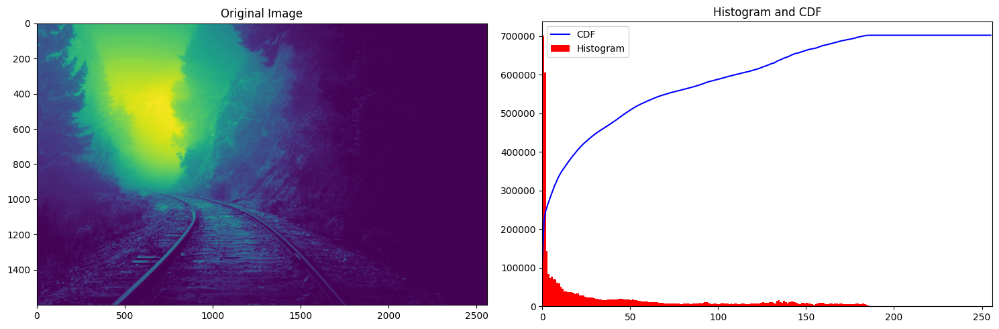

In [ ]:
# read the image in grayscale (importamt detail!)
img_2_gray = cv2.imread('nature_dark_forest.jpg', 0)

# get the images's histogram
hist, bins = np.histogram(img_2_gray.flatten(), 256, [0, 256])

# calculate the cdf
cdf = hist.cumsum()

# normalize the cdf
cdf_normalized = cdf * hist.max() / cdf.max()

# plot the image again with its corresponding cdf
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.imshow(img_2_gray)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.plot(cdf_normalized, color='b')
plt.hist(img_2_gray.flatten(), 256, range=(0,256), color='r')
plt.xlim([0,256])
plt.title("Histogram and CDF")
plt.legend(('CDF','Histogram'), loc='upper left')
plt.tight_layout()
plt.show()

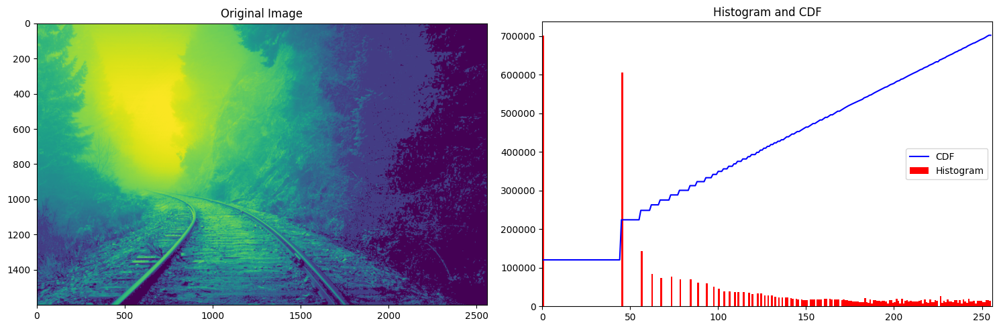

In [ ]:
# create the transformation function
cdf_m = np.ma.masked_equal(cdf, 0)
cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
cdf2 = np.ma.filled(cdf_m, 0).astype('uint8')

# apply the function to the image
img_2_trsf = cdf2[img_2_gray]

# calculate transformed image's histogram
hist_eq, bins_eq = np.histogram(img_2_trsf.flatten(), 256, [0, 256])

# calculate the cdf
cdf_eq = hist_eq.cumsum()

# normalize the cdf
cdf_normalized_eq = cdf_eq * hist_eq.max() / cdf_eq.max()

# plot the tranformed image with its corresponding histogram and cdf
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.imshow(img_2_trsf)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.plot(cdf_normalized_eq, color='b')
plt.hist(img_2_trsf.flatten(), 256, range=(0,256), color='r')
plt.xlim([0,256])
plt.title("Histogram and CDF")
plt.legend(('CDF','Histogram'), loc='center right')
plt.tight_layout()
plt.show()

After applying histogram equalization to the grayscale version, we notice a significant improvement in brightness and contrast. However, this enhancement is limited to intensity only and does not address the color balance of the image.

Because the original image is an RGB photo of a natural scene (forest), enhancing only brightness without considering color can make the result look dull or unnatural. To enhance both brightness and color simultaneously, we need a method that works directly on color images.

A good approach here is to apply [CLAHE](https://www.geeksforgeeks.org/clahe-histogram-eqalization-opencv/) (Contrast Limited Adaptive Histogram Equalization) to each of the R, G, and B channels separately. This method improves contrast adaptively across different regions of the image, preventing over-amplification of noise (thanks to the contrast limit), and at the same time enhances the color depth and richness of the image.

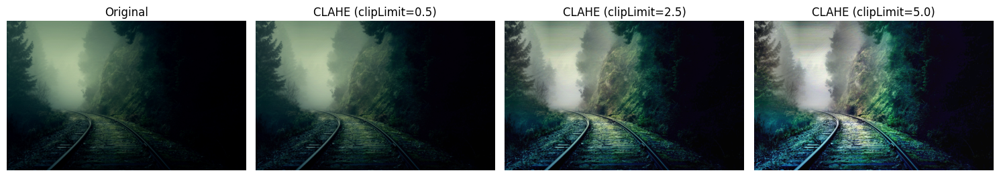

In [ ]:
# reload the original RGB image
img_2_rgb = cv2.imread('nature_dark_forest.jpg')
img_2_rgb = cv2.cvtColor(img_2_rgb, cv2.COLOR_BGR2RGB)

# define clipLimit values to try
clip_limits = [0.5, 2.5, 5.0]
clahe_results = []

# apply CLAHE to each channel for each clipLimit
for clip in clip_limits:
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=(8,8))
    channels = cv2.split(img_2_rgb)
    clahe_channels = []
    for ch in channels:
        cl = clahe.apply(ch)
        clahe_channels.append(cl)
    clahe_img = cv2.merge(clahe_channels)
    clahe_results.append((clip, clahe_img))

# plot the original and the CLAHE-enhanced images
plt.figure(figsize=(15, 5))

# original image
plt.subplot(1, len(clahe_results) + 1, 1)
plt.imshow(img_2_rgb)
plt.title('Original')
plt.axis('off')

# enhanced images
for i, (clip, img) in enumerate(clahe_results):
    plt.subplot(1, len(clahe_results) + 1, i + 2)
    plt.imshow(img)
    plt.title(f'CLAHE (clipLimit={clip})')
    plt.axis('off')

plt.tight_layout()
plt.show()

The original image is visibly dark with faded colors, making it hard to distinguish details, especially in shadowed areas. After applying CLAHE, we observe distinct effects at different clipLimit settings. With clipLimit $= 0.5$, the image appears slightly brighter with gentle contrast improvement, retaining a very natural look. At clipLimit $= 2.5$, the result is nicely balanced: the forest looks clearer, the greens are stronger, and more details appear in the trees and path. With clipLimit $= 5.0$, the image becomes very bright and the contrast is much stronger, but it starts to look a bit unnatural, especially the foggy area, which looks overexposed. This shows that while CLAHE works well, using a high clipLimit can make the image look unrealistic, and a middle value around $2.0 - 2.5$ often gives the best mix of better visibility and a natural appearance.

## Exercise 3. Enhancing Brightness of a RGB Image

In this exercise, we aim to enhance the perceived brightness of the following image. To achieve this, we will apply ```gamma correction```, a widely used technique that adjusts image brightness in a non-linear way, allowing us to brighten dark regions while preserving overall detail.

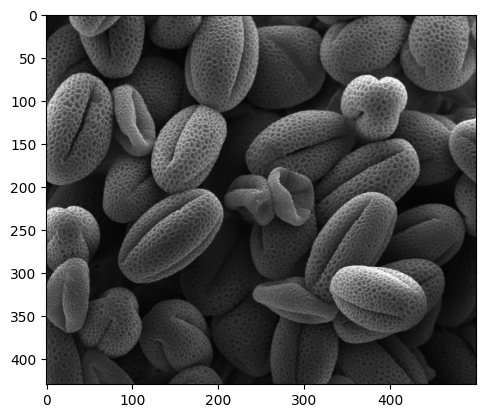

In [ ]:
# load the image sample
img_3 = cv2.imread('pollen-500x430px-96dpi.jpg')

# display the image
plt.imshow(img_3)
plt.show()

In [ ]:
# explore the image
print_image_info(img_3)

Image shape (height, width, channels): (430, 500, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 645000
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 1
Maximum pixel value: 255
Mean pixel value: 62.11
Standard deviation of pixel values: 38.39
Number of unique pixel values: 255


In [ ]:
# let's see how the image looks like in reality
print(img_3)

[[[15 15 15]
  [13 13 13]
  [12 12 12]
  ...
  [64 64 64]
  [70 70 70]
  [76 76 76]]

 [[15 15 15]
  [13 13 13]
  [13 13 13]
  ...
  [65 65 65]
  [67 67 67]
  [73 73 73]]

 [[16 16 16]
  [14 14 14]
  [13 13 13]
  ...
  [70 70 70]
  [66 66 66]
  [70 70 70]]

 ...

 [[75 75 75]
  [92 92 92]
  [66 66 66]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[72 72 72]
  [99 99 99]
  [69 69 69]
  ...
  [34 34 34]
  [32 32 32]
  [32 32 32]]

 [[77 77 77]
  [98 98 98]
  [71 71 71]
  ...
  [33 33 33]
  [29 29 29]
  [29 29 29]]]


Although the image is stored in RGB format, it visually appears grayscale (like the imeage of the moon in exercise $1$). To enhance its perceived brightness while preserving its color structure, we will apply **gamma correction**, a widely used technique that adjusts the intensity values (brightness) of an image in a way that aligns more closely with human visual perception.

[Gamma Correction](https://pyimagesearch.com/2015/10/05/opencv-gamma-correction/) helps address the human eye's tendency to be more sensitive to dark regions than to bright ones. By applying this method, we can make dark regions appear brighter and enhance overall visibility.

The correction is also known as the *Power Law Transform* and adjusts each pixel intensity using the following formula:

$$O = I^{(1 / G)}$$

where:
  *   $I$ is the input pixel intensity (scaled between $0$ and $1$),
  *   $G$ is the gamma value,
  *   and $O$ is the output (gamma-adjusted) intensity

After applying this operation, the image is rescaled back to the standard range of [0, 255].

A tiny example:

Let's take a pixel with intensity $I = 100$ (on a $0-255$ scale).
First, we normalize it: $I_{norm} = 100 / 255 \approx 0.39$.

Then, we apply gamma correction with gamma = $1.5$ using the formula: $O = (I_{norm})^{1/1.5} = (0.39)^{0.67} \approx 0.52$.

Finally, we scale it back: $O_{scaled} = 0.52 x 255 \approx 132$.

We see that the pixel value increases from 100 to about 132, confirming that the image becomes brighter.

Similarly, with gamma = 0.5:

$O = (0.39)^{1/0.5} = (0.39)^2 \approx 0.15$.

And rescale:

$O_{scaled} = 0.15 x 255 \approx 38$.

Here, the intensity drops from 100 to about 38, making the image darker.

We will try several gamma values to observe how different settings affect the brightness of the image.

In [ ]:
# create gamma correction function
def adjust_gamma(img, gamma = 1.0):
  """ Builds a lookup table mapping the pixel values [0, 255] to their adjusted gamma values. """

  # build a lookup table mapping the pixel values [0, 255] to their adjusted gamma values
  invGamma = 1.0 / gamma
  table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

  # apply gamma correction using the lookup table
  return cv2.LUT(img, table)

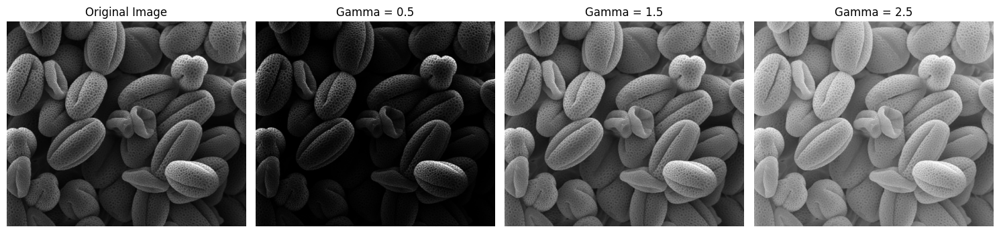

In [ ]:
# set some gamma values
gamma_values = [0.5, 1.5, 2.5]

# set up the figure: total subplots = original + len(gamma_values)
plt.figure(figsize=(15, 5))

# plot the original image first
plt.subplot(1, len(gamma_values) + 1, 1)
plt.imshow(adjust_gamma(img_3)) # gamma correction for gamma 1: original image remains the same !
plt.title('Original Image')
plt.axis('off')

# loop through gamma values, apply correction, and plot each result
for i, gamma_val in enumerate(gamma_values):
  img_trsf = adjust_gamma(img_3, gamma=gamma_val)
  plt.subplot(1, len(gamma_values) + 1, i + 2)
  plt.imshow(img_trsf)
  plt.title(f'Gamma = {gamma_val}')
  plt.axis('off')

plt.tight_layout()
plt.show()

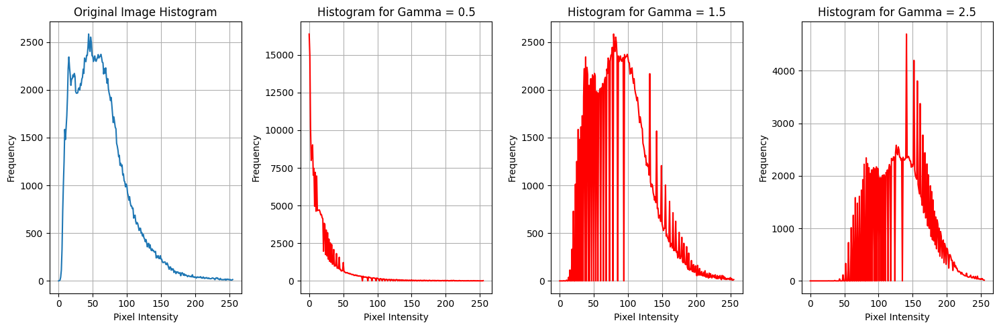

In [ ]:
# set up the figure for displaying the histograms
plt.figure(figsize=(15, 5))

# histogram of original image
hist_original = cv2.calcHist([img_3], [0], None, [256], [0, 256])
plt.subplot(1, len(gamma_values) + 1, 1)
plt.plot(hist_original)
plt.title('Original Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)

# histograms for each gamma-corrected image
for i, gamma_val in enumerate(gamma_values):
  img_trsf = adjust_gamma(img_3, gamma=gamma_val)
  hist_trsf = cv2.calcHist([img_trsf], [0], None, [256], [0, 256])
  plt.subplot(1, len(gamma_values) + 1, i + 2)
  plt.plot(hist_trsf, color='red')
  plt.title(f'Histogram for Gamma = {gamma_val}')
  plt.xlabel('Pixel Intensity')
  plt.ylabel('Frequency')
  plt.grid(True)

plt.tight_layout()
plt.show()

We observe that applying gamma correction significantly influences the perceived brightness of the image. Although the task focused on enhancing brightness, we also tested a gamma value of $0.5$ (as an extra step) to clearly illustrate the effect of gamma adjustment. As expected, gamma values $< 1$ shifts the image towards the darker regions, while gamma values $> 1$ will make the image appear lighter (gamma values $= 1$ will leave the image unchanged). So, to increase the brightness of an image, we typically select a gamma value greater than $1$, which effectively brightens the entire image and makes details in darker areas more visible. The histograms further confirm this effect, showing a significant shift of pixel intensities toward brighter values for gamma $> 1$, while gamma values $< 1$ compress intensities toward darker regions, reducing overall brightness. This flexibility makes gamma correction a simple yet powerful tool for adjusting image brightness and enhancing visual clarity.

## Exercise 4. Sharpening a Grayscale Image

In this exercise, we aim to enhance the sharpness of a grayscale image. We will use the same grayscale image of the moon, as in exercise 1. There are several techniques to achieve sharpening, typically involving high-pass filters that emphasize edges and fine details while reducing smooth, low-frequency areas. In this exercise, we will focus on the ```unsharp masking``` method, a simple and effective approach to bring out subtle details.

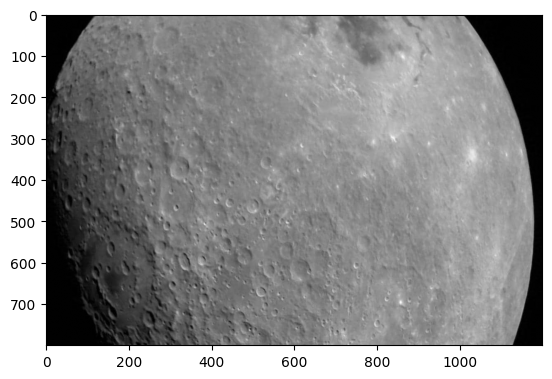

In [ ]:
# load a greyscale image sample
img_4 = cv2.imread('First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg', cv2.IMREAD_GRAYSCALE) # ensure the grayscale version of the image with 'cv2.IMREAD_GRAYSCALE' (remember the original image of the moon is in RGB)

# display the image
plt.imshow(img_4, cmap='gray')
plt.show()

The goal of sharpening is to enhance the image's fine details and edges, making features, such as the moon's craters and surface textures more pronounced and easier to analyze.

To understand sharpening, it's useful to think in terms of frequencies:

*   High-frequency components in an image correspond to rapid changes in intensity over short distances, such as edges, textures, and noise.

*   Low-frequency components represent slow, smooth changes in intensity, such as uniform backgrounds or smooth surfaces.

A high-pass filter emphasizes high-frequency components by reducing or removing low-frequency areas. This makes edges and fine details stand out more clearly. In contrast, a low-pass filter reduces details in the image by suppressing high frequencies, causing the image to appear more blurred.

Some sharpening techniques are:

*   **Unsharp Masking**:

  This method enhances edges by subtracting a blurred version of the image from the original: $Sharpened=Original+a*(Original-Blurred)$

  Instead of performing this in multiple steps, we use a single filter (kernel) that combines everything. A typical kernel for unsharp masking is:

  $$\frac{1}{α+1} \left[\begin{array}
   {rrr}
   -α & α-1 & -α \\
   α-1 & α+5 & α-1 \\
   -α & α-1 & -α
   \end{array}\right]$$

  (for a more ready-to-use solution, see the build-in unsharp masking function in [scikit-image's documentation](https://scikit-image.org/docs/stable/auto_examples/filters/plot_unsharp_mask.html).)

*   **High-Boost Filtering**:

  Closely related to unsharp masking, high-boost filtering increases the contribution of the original image using an amplification factor such as:

  $High Boost=A*Original-(Blurred)$

  When $A = 1$, this becomes a standard high-pass filter and for $A > 1$, the sharpening effect is stronger.

  A high-boost kernel can take a form like:

  $$\frac{1}{9} \left[\begin{array}
  {rrr}
  -1 & -1 & -1 \\
  -1 & z &  -1 \\
  -1 & -1 & -1
  \end{array}\right]$$

  where $z>8$.

*   **High-Pass Sharpening Filter**:

  A simpler filter that enhances edges using a fixed kernel such as:

  $$\left[\begin{array}
  {rrr}
  0 & -1 & 0 \\
  -1 & 5 & -1 \\
  0 & -1 & 0
  \end{array}\right]$$

These types of kernels sharpen an image by highlighting areas with rapid changes (edges) while keeping the overall structure intact.

In the following code block, we applied all the methods discussed and highlight the unsharp masking result with $a = 0.7$, which gave a pretty good balance of sharpness and clarity.

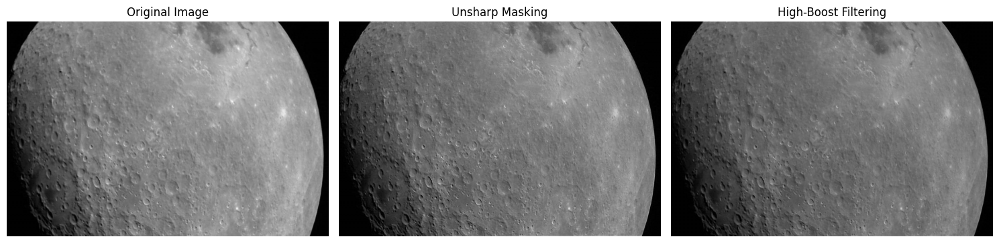

In [ ]:
# define sharpening kernel(s)

# unsharp masking
def unsharp(alpha=1.5):
  A1 = np.array([[-1, 1, -1],
                 [1,  1,  1],
                 [-1, 1, -1]])
  A2 = np.array([[0, -1, 0],
                 [-1, 5, -1],
                 [0, -1, 0]])
  return (alpha * A1 + A2) / (alpha + 1)

kernel_unsharp = unsharp(alpha=0.7)

# high-boost Filtering (slightly stronger boost)
kernel_highboost = -np.ones((3, 3), np.float32) / 9
kernel_highboost[1, 1] = kernel_highboost[1, 1] * (-15)

# high-pass sharpening filter
# kernel_highpass = np.array([[0, -1, 0],
#                             [-1, 5, -1],
#                             [0, -1, 0]])

# apply the kernel to the image
img_unsharp = cv2.filter2D(img_4, -1, kernel_unsharp, borderType=cv2.BORDER_CONSTANT)
img_highboost = cv2.filter2D(img_4, -1, kernel_highboost, borderType=cv2.BORDER_CONSTANT)
# img_highpass = cv2.filter2D(img_4, -1, kernel_highpass, borderType=cv2.BORDER_CONSTANT)

# display all results in a single row
titles = ['Original Image', 'Unsharp Masking', 'High-Boost Filtering', 'High-Pass Sharpening']
images = [img_4, img_unsharp, img_highboost] #, img_highpass]

plt.figure(figsize=(15, 5))
for i in range(len(images)):
  plt.subplot(1, len(images), i + 1)
  plt.imshow(images[i], cmap='gray')
  plt.title(titles[i])
  plt.axis('off')

plt.tight_layout()
plt.show()

For this exercise, the unsharp masking with $α = 0.7$ strikes a slightly better balance compared to high-boost filtering, as we can see finer details and lighter areas, such as crater edges and surface textures, appearing more clearly and naturally enhanced. While both methods successfully sharpen the image, unsharp masking preserves a more natural appearance without overly darkening the image, making it a more visually balanced choice.

It is also possible to explore the other methods mentioned earlier by uncommenting the relevant parts in the code to compare their effects. Additionally, experimentation with different $a$ values, or trying scikit-images build-in unsharp masking function could further optimize the sharpening effect and help to emphasize specific details.

## Exercise 5. Investigating Combined Spatial Enhancements

In this exercise, we explore the transformation between two grayscale images using combined spatial enhancement methods. We will try to build ```enhancement pipelines``` that combine operations like gamma correction, brightness/contrast adjustments, sharpening, blurring or arithmetice operations to replicate and reverse the transformations between two images.

Let's begin by loading and displaying both images side by side for a visual inspection.

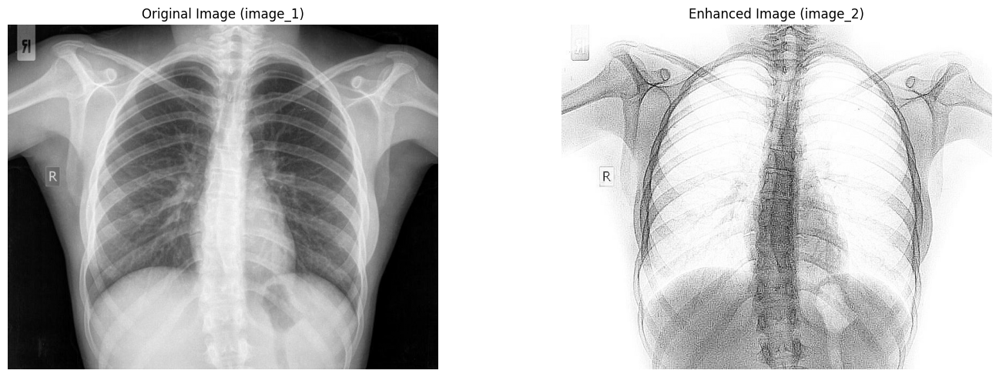

In [ ]:
# load the images
img_1 = cv2.imread('image_1.jpg', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('image_2.jpg', cv2.IMREAD_GRAYSCALE)

# display the two images side by side
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_1, cmap='gray')
plt.title('Original Image (image_1)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_2, cmap='gray')
plt.title('Enhanced Image (image_2)')
plt.axis('off')

plt.tight_layout()
plt.show()

As we see, we have two grayscale X-ray images:  

*   ``image_1``, which appears as a standard chest X-ray with natural contrast and balanced brightness.
*   ``image_2``, which has been noticeably enhanced, showing increased brightness, higher contrast, and sharper fine details (but also more visible noise).

Our task is:

*   (a) to analyze the changes and guess the processing steps (likely involving combined spatial enhancement methods such as arithmetic operations, gray level transformations, and sharpening filters) that were applied to convert ``image_1`` to ``image_2``;
*   (b) to propose and implement a reverse processing pipeline aiming to recover an approximation of ``image_1`` starting from ``image_2``.

Apart from the visual representation of the two images, let's examine some key statistics such as pixel intensity range, mean, and standard deviation, along with their histograms. This might help us identify the type of enhancement applied, such as brightness/contrast adjustment, sharpening, or added noise.

In [ ]:
# info of the two images
print("Image 1:")
print_image_info(img_1)

print("\nImage 2:")
print_image_info(img_2)

Image 1:
Image shape (height, width): (641, 800)
Number of dimensions: 2
Image type: Grayscale
Total number of elements (pixels x channels): 512800
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 240
Mean pixel value: 121.46
Standard deviation of pixel values: 68.2
Number of unique pixel values: 241

Image 2:
Image shape (height, width): (641, 800)
Number of dimensions: 2
Image type: Grayscale
Total number of elements (pixels x channels): 512800
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 255
Mean pixel value: 217.6
Standard deviation of pixel values: 48.98
Number of unique pixel values: 256


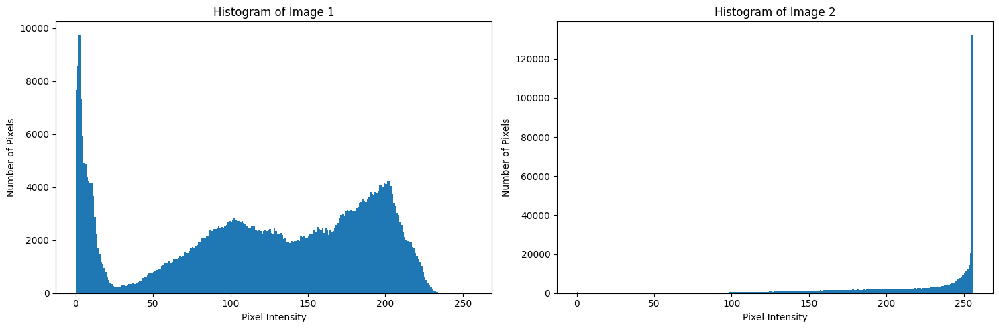

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.hist(img_1.flatten(), bins=256, range=(0, 256))
plt.title('Histogram of Image 1')
plt.xlabel('Pixel Intensity')
plt.ylabel('Number of Pixels')

plt.subplot(1, 2, 2)
plt.hist(img_2.flatten(), bins=256, range=(0, 256))
plt.title('Histogram of Image 2')
plt.xlabel('Pixel Intensity')
plt.ylabel('Number of Pixels')

plt.tight_layout()
plt.show()

From the retrieved statistics, we observe that both images have the same dimensions and are grayscale, but there are some key differences. Image $2$ reaches the full dynamic range $(0-255)$ while image $1$ is limited to $0-240$, indicating that image $2$ was stretched to maximize contrast. The mean pixel value jumps from about $121.5$ in image $1$ to $217.6$ in image $2$, showing a substantial overall brightening. Interestingly, the standard deviation decreases from $68.2$ to $48.98$, meaning that despite the brightening, the spread of pixel intensities became narrower, likely because much of the image is now pushed toward high intensity. The histograms confirm this: image $1$ shows a more balanced spread of intensities, while image $2$ has a strong peak near the bright end (around $255$), suggesting aggressive brightness/contrast enhancement and possibly a sharpening effect that also introduced visible noise.

### 5.1. Guesing Processing Steps to Convert Image $1$ to Image $2$

For pipeline $1$, we aim to replicate this transformation through a sequence of contrast and detail enhancements. We begin with a complement operation to invert the tonal structure, followed by gamma correction to boost overall brightness and lighten darker regions. Next, we apply unsharp masking to enhance the visibility of bone structures and sharpen key anatomical features. To further increase brightness, we apply a uniform brightness adjustment, and finally, we refine local contrast using CLAHE to closely reproduce the high-contrast, sharpened appearance of image $2$.

In [ ]:
# useful functions
def increase_brightness(image, value=10):
  """ Increases brightness uniformly (basic gray level transformation). """
  return cv2.add(image, value)

def complement(image):
  """ Applies complemet operation. """
  return 255 - image

def adjust_gamma(image, gamma=1.0):
  """ Builds a lookup table mapping the pixel values [0, 255] to their adjusted gamma values. """
  invGamma = 1.0 / gamma
  table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
  return cv2.LUT(image, table)

def unsharp_mask(image, alpha=1.5):
  """ Applies unsharp masking to an image. """
  blurred = cv2.GaussianBlur(image, (0, 0), sigmaX=3)
  return cv2.addWeighted(image, 1 + alpha, blurred, -alpha, 0)

def apply_hist_eq(image):
  """ Applies histogram equalization to an image. """
  return cv2.equalizeHist(image) # use of OpenCV's built-in function

def apply_gaussian_blur(image, kernel_size=3):
  """ Applies Gaussian blur to an image. """
  return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

def apply_median_filter(image, kernel_size=3):
  """Applies a median filter to reduce noise."""
  return cv2.medianBlur(image, kernel_size)

def apply_clahe(image, clipLimit=2.0, tileGridSize=(8,8)):
  """ Applies Contrast Limited Adaptive Histogram Equalization (CLAHE) to an image. """
  clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
  return clahe.apply(image)

def pixel_intensity_similarity(img1, img2, tolerance=5):
  """ Compares two grayscale images and returns the percentage of pixels that have intensity values within a certain tolerance. """

  # ensure both images have the same shape
  if img1.shape != img2.shape:
    raise ValueError("Input images must have the same shape.")

  # compute absolute difference
  diff = np.abs(img1 - img2)

  # count pixels within tolerance
  similar_pixels = np.sum(diff <= tolerance)

  # calculate percentage
  total_pixels = img1.size
  similarity_percentage = (similar_pixels / total_pixels) * 100

  return similarity_percentage

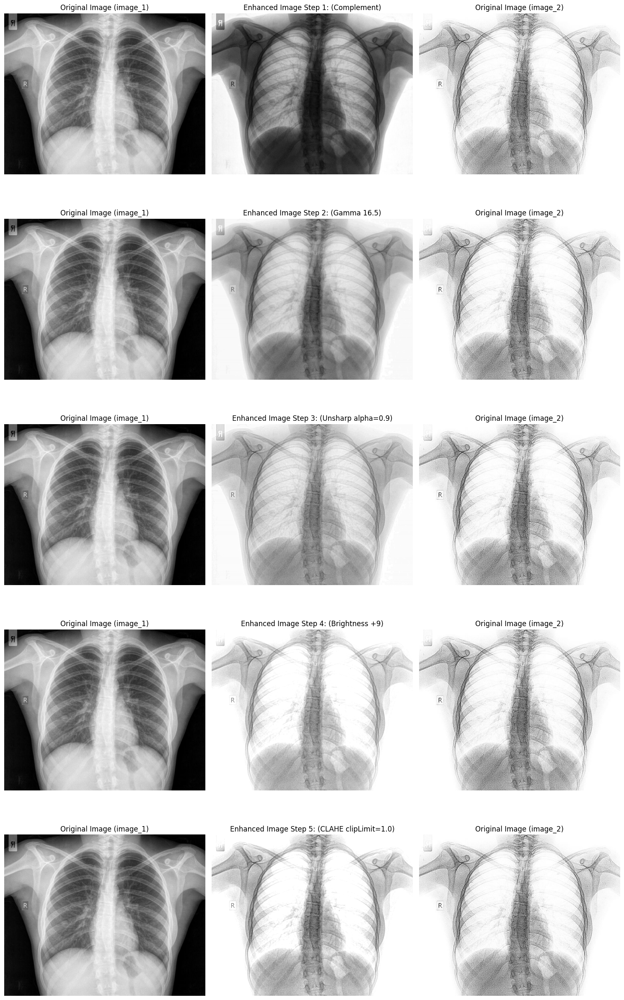

In [ ]:
# PIPELINE 1: convert image_1 to image_2

# storage list for each step
results = []

# step 1: complement
step1 = complement(img_1)
results.append(('Complement', step1))

# step 2: gamma correction
step2 = adjust_gamma(step1, gamma=16.5)
results.append(('Gamma 16.5', step2))

# step 3: unsharp masking
step3 = unsharp_mask(step2, alpha=0.9)
results.append(('Unsharp alpha=0.9', step3))

# step 4: increase brightness
step4 = increase_brightness(step3, value=9)
results.append(('Brightness +9', step4))

# step 5: clahe
step5 = apply_clahe(step4, clipLimit=1.0) # apply_gaussian_blur(step4, kernel_size=5)
results.append(('CLAHE clipLimit=1.0', step5))

# display all steps
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 25))

for i, (desc, intermediate) in enumerate(results):
    # left: Original img_1
    axes[i, 0].imshow(img_1, cmap='gray')
    axes[i, 0].set_title('Original Image (image_1)')
    axes[i, 0].axis('off')

    # middle: Intermediate result
    axes[i, 1].imshow(intermediate, cmap='gray')
    axes[i, 1].set_title(f'Enhanced Image Step {i+1}: ({desc})')
    axes[i, 1].axis('off')

    # right: Original img_2 (target)
    axes[i, 2].imshow(img_2, cmap='gray')
    axes[i, 2].set_title('Original Image (image_2)')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# a funny check of the similarity in terms of pixel intensity between image 2 and the image produced by the pipeline 1
similarity = pixel_intensity_similarity(step5, img_2, tolerance=15) # tolerance=5 means the pixel intensities that differ by up to 5 gray levels are still considered "similar"
print(f"Pixel intensity similarity: {similarity:.2f}%")

Pixel intensity similarity: 53.48%


We see the gradual transformation of image $1$ across the pipeline: each step progressively brings the image closer in brightness, contrast, and sharpness to the image $2$, demonstrating the effectiveness of the pipeline by combining complement, gamma correction, sharpening, brightness boosting, and local contrast enhancement.

### 5.2. Approximating Image $1$, Starting from Image $2$

For pipeline $2$, we aim to reverse the enhancement and approximate image $1$ starting from image $2$. We begin with a complement operation to invert the tonal range, followed by gamma correction to increase overall brightness. To further lift the overall brightness, we apply a uniform brightness increase. Then, we introduce Gaussian blur with a large kernel to smooth the image, creating a softer, more natural appearance similar to image $1$. Finally, a median filter further suppress noise and fine details, producing a more balanced, less intense result close to image $1$.

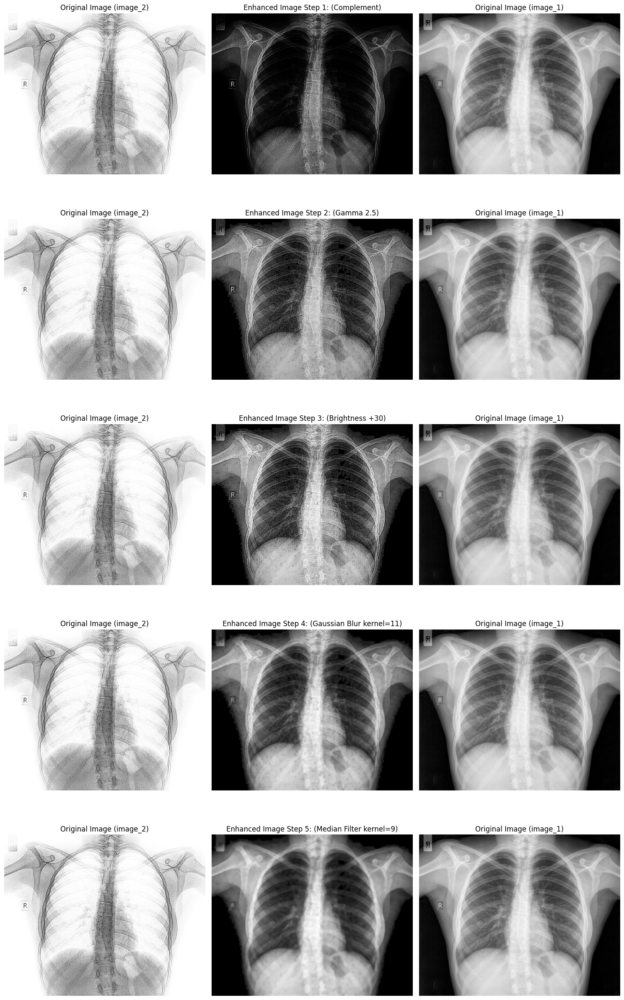

In [ ]:
# PIPELINE 2: convert image_2 to image_1

# storage list for each step
results2 = []

# step 1: complement
step1 = complement(img_2)
results2.append(('Complement', step1))

# step 2: gamma correction
step2 = adjust_gamma(step1, gamma=2.5)
results2.append(('Gamma 2.5', step2))

# step 3: increase brightness
step3 = increase_brightness(step2, value=30)
results2.append(('Brightness +30', step3))

# step 4: gaussian blur
step4 = apply_gaussian_blur(step3, kernel_size=11)
results2.append(('Gaussian Blur kernel=11', step4))

# step 5: median filter
step5 = apply_median_filter(step4, kernel_size=9)
results2.append(('Median Filter kernel=9', step5))

# display all steps
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 25))

for i, (desc, intermediate) in enumerate(results2):
    # left: Original img_2
    axes[i, 0].imshow(img_2, cmap='gray')
    axes[i, 0].set_title('Original Image (image_2)')
    axes[i, 0].axis('off')

    # middle: Intermediate result
    axes[i, 1].imshow(intermediate, cmap='gray')
    axes[i, 1].set_title(f'Enhanced Image Step {i+1}: ({desc})')
    axes[i, 1].axis('off')

    # right: Original img_1 (target)
    axes[i, 2].imshow(img_1, cmap='gray')
    axes[i, 2].set_title('Original Image (image_1)')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# check the similarity of the resulted images
# similarity = pixel_intensity_similarity(step5, img_2, tolerance=15)
# print(f"Pixel intensity similarity: {similarity:.2f}%")

We observe the progressive transformation of image $2$ through the pipeline: each step gradually reduces sharpness, decreases the intense contrast, and smooths out harsh details, successfully moving the image closer in appearance to image $1$. The combination of complement inversion, gamma correction, brightness adjustment, and successive blurring effectively softens the image and reduces noise, resulting in a more natural appearance very similar to image $1$. Although, we notice that the final result appears slightly darker than the target, suggesting that further fine-tuning of parameters, such as adjusting gamma values, modifying brightness levels, or even changing the order of operations could further improve the visual match and achieve an even closer approximation to the desired reference.

## Exercise 6. Detecting Edges, Angles, Corners and Windows in a Real-World Image

In this exercise, we analyze an image with a natural scene (a house with a sloped roof) to perform fundamental image processing tasks. We aim to extract the main edges, estimate the angles of the roof's diagonal lines, detect prominent corners, and use this information to locate key features like windows.

To accomplish these tasks, some common detectors are ```Canny``` for identifying edges, the **Hough** detector for estimating line angles, and corner detectors such as ```Harris``` for finding keypoints.

Let's begin by loading and displaying the image for a visual inspection.

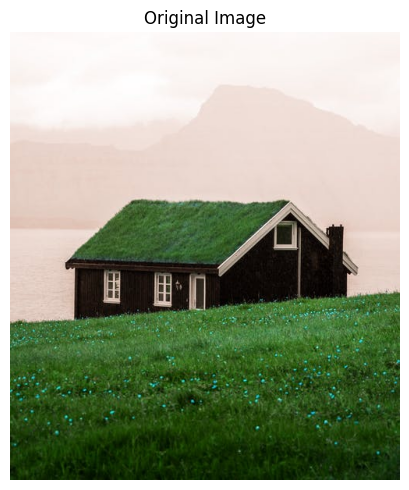

In [ ]:
# load a rgb image sample
img_6 = cv2.imread('image11.jpg')

# display the original image in color and grayscale
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_6)
plt.title('Original Image')
plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(img_6, cv2.COLOR_BGR2GRAY), cmap='gray')
# plt.title('Grayscale Image')
# plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# explore the image
print_image_info(img_6)

Image shape (height, width, channels): (574, 500, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 861000
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 255
Mean pixel value: 134.53
Standard deviation of pixel values: 93.72
Number of unique pixel values: 256


In [ ]:
# let's see how the image looks like in reality
print(img_6)

[[[253 249 248]
  [253 249 248]
  [253 249 248]
  ...
  [252 247 244]
  [252 247 244]
  [252 247 244]]

 [[253 249 248]
  [253 249 248]
  [253 249 248]
  ...
  [251 246 243]
  [251 246 243]
  [251 246 243]]

 [[253 249 248]
  [253 249 248]
  [253 249 248]
  ...
  [251 246 243]
  [251 246 243]
  [251 246 243]]

 ...

 [[ 25  57  16]
  [ 25  58  14]
  [ 27  57  14]
  ...
  [ 16  38  10]
  [ 18  39  14]
  [ 20  42  14]]

 [[ 23  58  14]
  [ 24  60  14]
  [ 25  58  13]
  ...
  [ 14  36   7]
  [ 17  39  11]
  [ 19  41  12]]

 [[ 23  59  13]
  [ 23  59  13]
  [ 24  58  11]
  ...
  [ 14  36   7]
  [ 16  38   9]
  [ 18  40  11]]]


### 6.1. Detecting the Main Edges of an Image

In this step, we apply edge detection to the grayscale version of the image. We use the **Canny edge detector**, which is effective for identifying sharp changes in intensity, ideal for capturing the house's edges, rooflines, and other architectural details.

Edge detection algorithms work based on gradients, measuring how pixel intensity changes across space. Since color (RGB) images have three channels, applying edge detection directly to them can be noisy and ambiguous. Therefore, we first convert the image to grayscale, which simplifies the data to a single channel while preserving the structural features necessary for accurate edge detection.

In addition to the Canny detector, we also experiment with other popular methods: the Sobel filter (combining X and Y gradients) and the Laplacian operator. These alternative techniques help us compare how different approaches perform in highlighting edges and fine structures. All methods are implemented using OpenCV's built-in functions. More theory and tiny implementation examples, here: [Canny Edge Detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html), [Sobel filtering](https://docs.opencv.org/4.x/d2/d2c/tutorial_sobel_derivatives.html) and [Laplacian filtering](https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html).

We'll also display both the grayscale image and its detected edges side by side, and later compare the results across all methods, to assess their effectiveness visually.

A Closer Look at the **Canny Edge Detector**

The Canny Edge Detector is one of the most popular and robust edge detection algorithms, introduced by John Canny in 1986. It is designed to meet three main criteria:

*   Good edge detection: Find all real edges with minimal false detections.
*   Good localization: The detected edges should be as close as possible to the true edges.
*   Single response: Each edge should result in only one detected line (no duplicates).

The algorithm works in four key practical steps, which very briefly are descriped below:

1.   **Noise reduction:** A Gaussian filter smooths the image to reduce noise before edge detection. This step ensures that small fluctuations don't create false edges.
2.   **Gradient calculation:** The algorithm checks how quickly the brightness changes across the image. It measures both how strong the change is (edge strength) and which direction it's pointing (edge direction).
3.   **Non-maximum suppression:** To keep the edges thin and clear, the algorithm keeps only the strongest points along each edge and removes weaker nearby points. This makes the edges look like thin lines.
4.   **Hysteresis thresholding:** Two thresholds are applied: a high and a low. Strong edges (above the high threshold) are kept, and weak edges (between the low and high thresholds) are kept only if connected to strong edges. This prevents false positives while preserving important weak edges.

This combination makes the Canny detector effective in finding well-defined, continuous edges while suppressing noise and irrelevant details.

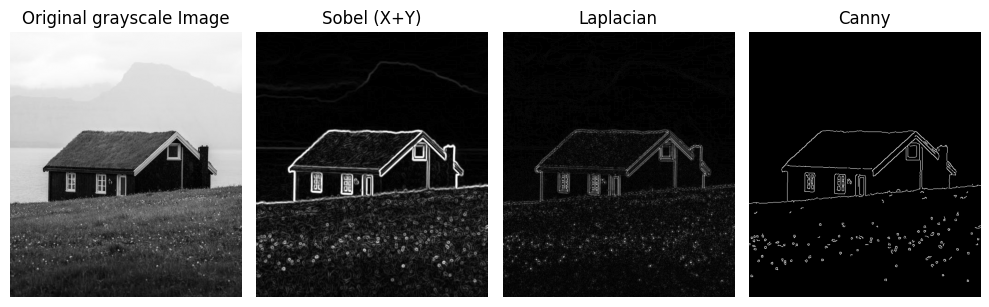

In [ ]:
# convert to grayscale
img_6_gray = cv2.cvtColor(img_6, cv2.COLOR_BGR2GRAY)

# apply Gaussian blur to reduce noise before edge detection
blurred_img = cv2.GaussianBlur(img_6_gray, (5, 5), 1.5)

# apply Sobel edge detection (X and Y)
sobel_x = cv2.Sobel(blurred_img, cv2.CV_64F, dx=1, dy=0, ksize=3)
sobel_y = cv2.Sobel(blurred_img, cv2.CV_64F, dx=0, dy=1, ksize=3)

# combine Sobel X and Y using magnitude
sobel_combined = cv2.magnitude(sobel_x, sobel_y)
sobel_combined = cv2.convertScaleAbs(sobel_combined)

# apply Laplacian edge detection
laplacian = cv2.Laplacian(blurred_img, cv2.CV_64F)
laplacian_abs = cv2.convertScaleAbs(laplacian)

# apply Canny edge detection
# threshold1 = 100 --> lower threshold (for hysteresis: keeps edges connected to strong ones)
# threshold2 = 150 --> upper threshold (strong edge threshold: edges above this are always kept)
canny = cv2.Canny(blurred_img, threshold1=100, threshold2=150)

# display all results in a single row
titles = ['Original grayscale Image', 'Sobel (X+Y)', 'Laplacian', 'Canny']
images = [img_6_gray, sobel_combined, laplacian_abs, canny]

plt.figure(figsize=(10, 5))
for i in range(4):
  plt.subplot(1, 4, i + 1)
  plt.imshow(images[i], cmap='gray')
  plt.title(titles[i])
  plt.axis('off')

plt.tight_layout()
plt.show()

We observe that the Sobel (X+Y) filter highlights edges quite well but introduces some noise, especially in flat regions like the roof and grass. The Laplacian also enhances fine details but appears weaker and less sharp overall. In contrast, the Canny detector produces the cleanest and most distinct edges, capturing the key structural elements of the house, such as rooflines and windows, while suppressing much of the background noise. However, we still notice fine edges appearing in the grass area because Canny detects any sharp intensity change, and the grass field contains small bright spots (like flowers) that create those edges. This confirms that Canny is the most effective option here for detecting the main architectural edges with clarity.


### 6.2. Estimating the Angle of the Diagonal Edges of the Roof

We now aim to estimate the angle of the diagonal roof edges relative to the horizontal axis. To achieve this, we'll use the **Hough Line Transform** to detect straight lines in the image and compute their angles based on their orientation.

The [Hough Line Transform](https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html) is a robust and powerful technique for detecting straight lines in an image, even if they are slightly broken or noisy. The core idea is to transform each edge point from image space $(x, y)$ into a parameter space defined by the line equation in polar form: $\rho = x \cos \theta + y \sin \theta$, where

*   $\rho$ is the perpendicular distance from the origin (top-left corner of the image) to the line (larger $\rho$ → line farther from origin, smaller $\rho$ → line closer to origin),
*   $θ$ is the angle between the x-axis and this perpendicular (measured counter-clockwise).

In Hough space, each edge point votes for all possible lines it could belong to, and strong straight lines appear as peaks (clusters of votes) in the accumulator. This makes it highly effective at detecting dominant linear structures. For example a vertical line has $\theta = 0°$, a vertical line has $\theta = 90°$ and diagonal lines (like a roof edge) fall somewhere between these extremes. After identifying the most representative diagonal lines, we compute the final roof angle by averaging the angles of these selected lines to obtain a robust estimate.

In our task, we apply the Hough Line Transform to the edge map generated by the Canny detector in the previous section and analyze the detected lines to extract the angles of the roof edges. Since the roof's diagonal edges are long and straight, they produce clear peaks in Hough space, allowing us to estimate their orientation precisely. After identifying the most representative diagonal lines, we compute the final roof angle by **averaging** the angles of these selected lines to obtain a robust estimate.

We experiment with both the **standard Hough Line Transform (HoughLines)** to detect the main roof lines and the **Probabilistic Hough Line Transform (HoughLinesP)** as an optional additional step to capture the full edges of the roof. The standard version returns full infinite lines in $(\rho, \theta)$ form, while the probabilistic version directly provides the endpoints of finite line segments $(x_1, y_1, x_2, y_2)$, making it more precise for localized structures. Using both allows us to compare how each method handles the roof geometry, ensuring reliable angle estimation.

Line 6: rho=-91.00, theta=135.00 degrees

Line 14: rho=402.00, theta=45.00 degrees

Line 18: rho=414.00, theta=45.00 degrees

Line 20: rho=262.00, theta=46.00 degrees

Line 22: rho=404.00, theta=45.00 degrees

Line 24: rho=-103.00, theta=135.00 degrees



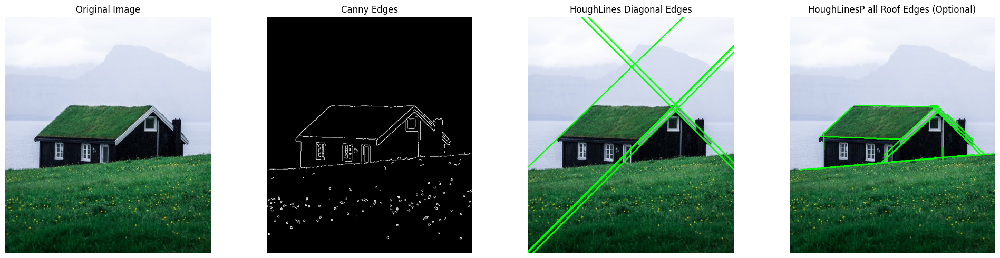


[HoughLines] Estimated average roof angle: 44.83 degrees
[HoughLinesP] Estimated average roof angle: 43.46 degrees


In [ ]:
# apply the Probabilistic Hough Line Transform to detect straight lines
lines = cv2.HoughLinesP(
    canny,                # input is is the binary edge map from Canny (no mask is applied to isolate only the roof)
    rho=1,                # distance resolution in pixels (accuracy of rho)
    theta=np.pi / 180,    # angle resolution in radians (1 degree steps)
    threshold=60,         # minimum number of votes (intersections) to detect a line (lowering this -> detects more lines, increasing it -> reduces noise)
    minLineLength=60,     # minimum length of a line (in pixels) to be accepted (set high enough to avoid detecting very short segments like noise)
    maxLineGap=27         # maximum allowed gap between points on the same line to link them (helps connect broken line segments, e.g. roof edges split by texture)
)

# create a copy to draw lines on it (visualization purposes)
line_img_p = img_6.copy()

angles_p = [] # storage list for the angles of diagonal roof lines

# process Probabilistic Hough lines

# iterate through each detected line, draw it, and calculate its angle
if lines is not None:
  for line in lines:
    x1, y1, x2, y2 = line[0]  # extract line segment endpoints

    # draw each detected line in green with thickness 2 for visibility
    cv2.line(line_img_p, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # calculate the angle of the line relative to the horizontal axis
    angle = np.degrees(np.arctan2(y2 - y1, x2 - x1))

    # keep only diagonal lines (roof-like) within 35°–55° range (this removes irrelevant horizontal/vertical lines like windows and walls)
    if (35 < abs(angle) < 55):
      angles_p.append(angle)


# aply the standard Hough Line Transform
lines_std = cv2.HoughLines(
    canny,                # input is is the binary edge map from Canny
    rho=1,                # distance resolution in pixels
    theta=np.pi / 180,    # angle resolution in radians
    threshold=65          # minimum number of votes (higher = fewer, stronger lines)
)

line_img_std = img_6.copy() # create a copy to draw Standard Hough lines
angles_std = []  # storage for angles of diagonal roof lines (HoughLines)

# process Standard Hough lines

# iterate through each detected line, draw it, and calculate its angle
if lines_std is not None:
  for i, line in enumerate(lines_std):
    rho, theta = line[0]           # extract rho (distance) and theta (angle in radians)
    theta_deg = np.degrees(theta)  # convert theta from radians to degrees for easier filtering

    # select only the roof diagonal lines (approx. in 45 and 135 radians)
    if (42 < theta_deg < 46.5) or (134 < theta_deg < 136):

      # just check how many lines we have
      print(f"Line {i}: rho={rho:.2f}, theta={theta_deg:.2f} degrees\n")

      # calculate the line's cosine and sine components
      a = np.cos(theta)
      b = np.sin(theta)

      # compute the base point (x0, y0) on the line using rho and angle
      x0 = a * rho
      y0 = b * rho

      # calculate two endpoints far along the line for drawing
      x1 = int(x0 + 1000 * (-b))
      y1 = int(y0 + 1000 * (a))
      x2 = int(x0 - 1000 * (-b))
      y2 = int(y0 - 1000 * (a))

      # draw the filtered diagonal line on the image
      cv2.line(line_img_std, (x1, y1), (x2, y2), (0, 255, 0), 2)

      # calculate the angle of the line relative to the horizontal axis
      angle = np.degrees(np.arctan2(y2 - y1, x2 - x1))
      angles_std.append(angle)  # store it for averaging later


# display original image, its Canny edges, and its Detected Lines side by side
plt.figure(figsize=(20, 5))

# original Image
plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(img_6, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Canny Edges
plt.subplot(1, 4, 2)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')

# standard Hough Lines
plt.subplot(1, 4, 3)
plt.imshow(cv2.cvtColor(line_img_std, cv2.COLOR_BGR2RGB))
plt.title('HoughLines Diagonal Edges')
plt.axis('off')

# probabilistic Hough Lines
plt.subplot(1, 4, 4)
plt.imshow(cv2.cvtColor(line_img_p, cv2.COLOR_BGR2RGB))
plt.title('HoughLinesP all Roof Edges (Optional)')
plt.axis('off')

plt.tight_layout()
plt.show()

# print the estimated average angle of the diagonal lines
if angles_std:
  avg_angle_std = np.mean(np.abs(angles_std))
  print(f"\n[HoughLines] Estimated average roof angle: {avg_angle_std:.2f} degrees")
else:
  print("[HoughLines] No diagonal roof lines detected.")

if angles_p:
  avg_angle_p = np.mean(np.abs(angles_p))
  print(f"[HoughLinesP] Estimated average roof angle: {avg_angle_p:.2f} degrees")
else:
  print("[HoughLinesP] No diagonal roof lines detected.")

The results demonstrate that the Standard Hough Line Transform (HoughLines) successfully detects the diagonal roof edges. The four images shown side by side, the original image, the Canny edge map, the HoughLines output, and optionally the HoughLinesP output, offer a clear visual progression from raw edges to the extracted line structures.

The Canny edge detector isolates clean edge features of the house. The HoughLines method then extends these detections into full-length infinite lines, which results in overextended lines crossing the entire image. After detecting all candidate lines, we apply filtering to retain only the diagonals and then further narrow the selection to the most relevant ones (those closest to $45°$ and $135°$, which represent the main roof slopes). Despite the initial overextension, this targeted filtering yields a precise average roof angle around $44-45°$, closely matching the actual roof slope.

When applied, the Probabilistic Hough Line Transform (HoughLinesP) focuses on detecting straight line segments, allowing for a more localized and precise tracing of the roof's diagonal edges. In this additional example, we extended the detection to cover the entire roof and house structure. Although the use of HoughLinesP is optional in this context, it delivers average roof angle estimates that closely match those obtained with the standard HoughLines method.

This confirms that both techniques are robust for estimating structural angles: HoughLinesP offers detailed local segment detections, while HoughLines provides a global perspective that can reveal underlying geometric patterns even if they extend beyond visible boundaries. Extra lines (like ground edges or walls) can appear in both cases, but our strict angle filtering ensures that only relevant diagonal roof lines contribute to the final angle estimation, keeping the result precise and reliable.

### 6.3. Detecting Corners in the Image

In this part, we aim to detect key corners of the house, such as the corners of windows, roof edges, and the door. We will apply the **Harris Corner Detection** method, which identifies points in the image where intensity changes sharply in multiple directions (ideal for detecting corners and junctions). To provide a more complete comparison, we'll also apply the **Shi-Tomasi Corner Detector**, a refinement of Harris that tends to be more selective and robust.

How Corner Detectors Work:

*   **Harris Corner Detector:**

  [Harris](https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html) analyzes the gradient of intensity in small neighborhoods to find regions where the image shows a sharp change in multiple directions (typically at corners). It computes a corner response function (R) based on the determinant and trace of the gradient covariance matrix. Strong corners are identified when this response exceeds a threshold. Harris is simple and effective but may pick up more noise in textured areas (like grass)
*   **Shi-Tomasi Corner Detector (Good Features to Track):**

  This is a refinement of the Harris method. Instead of using the corner response, [Shi-Tomasi](https://docs.opencv.org/4.x/d4/d8c/tutorial_py_shi_tomasi.html) ranks corners based on the minimum eigenvalue of the gradient matrix, selecting strongest corners only. It generally results in cleaner detections and is more robust to noise, which is why it's popular for tasks like object tracking.

Comparing Harris and Shi-Tomasi allows us to see the trade-off between sensitivity and precision. Harris may detect many corners (including weak/noisy ones), while Shi-Tomasi focuses on the strongest, most reliable corners.

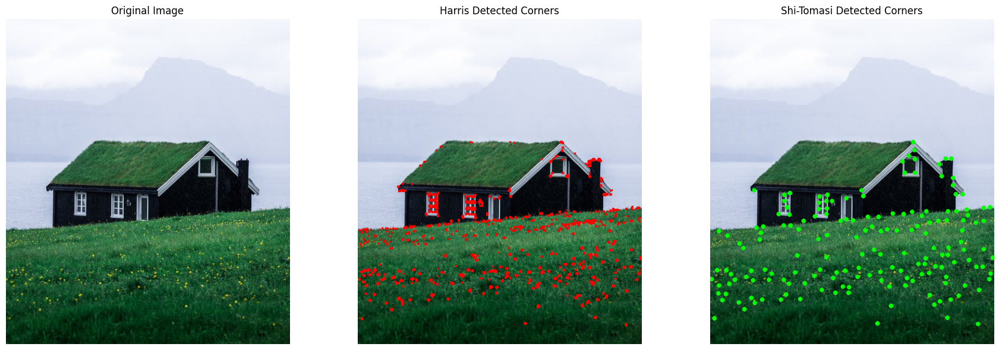

In [ ]:
# 1. Harris Corner Detection: apply Harris corner detection to find corners based on changes in intensity
dst = cv2.cornerHarris(img_6_gray, blockSize=2, ksize=3, k=0.04) # work on grayscale version of image

# dilate the corner points to make them more visible
dst_dilated = cv2.dilate(dst, None)

# threshold to mark strong corners in red
harris_img = img_6.copy()
harris_img[dst_dilated > 0.01 * dst_dilated.max()] = [0, 0, 255]  # red color

# 2. Shi-Tomasi (Good Features to Track: typically gives cleaner corner points)
max_corners = 170     # maximum number of corners to detect
quality_level = 0.01  # minimum accepted quality of corner
min_distance = 10     # minimum possible Euclidean distance between corners

corners = cv2.goodFeaturesToTrack(img_6_gray, max_corners, quality_level, min_distance)
corners = corners.astype(int)

# copy of the image to draw Shi-Tomasi corners
shi_tomasi_img = img_6.copy()

# draw detected corners as small green circles
for i in corners:
  x, y = i.ravel()
  cv2.circle(shi_tomasi_img, (x, y), 4, (0, 255, 0), -1)

# display all results side by side
plt.figure(figsize=(18, 6))

# original image
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img_6, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# corners detected by Harris
plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(harris_img, cv2.COLOR_BGR2RGB))
plt.title('Harris Detected Corners')
plt.axis('off')

# corners detected by Shi-Tomasi
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(shi_tomasi_img, cv2.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Detected Corners')
plt.axis('off')

plt.tight_layout()
plt.show()

The results show that the Harris detector identifies a large number of corners across the image, including fine details on the house and many points in the grassy area like flowers. In contrast, the Shi-Tomasi detector focuses on fewer, stronger corners, with better localization on the key architectural features—such as windows, roof edges, and doors—while suppressing much of the noise.

Overall, Shi-Tomasi provides a cleaner and more precise detection for the task of identifying meaningful structural corners in the house. Harris, while useful, tends to over-detect corners in textured regions, which can be less helpful if we're targeting specific architectural features.

### 6.4. Locating the Windows Using the Detected Corners

In this section, our goal is to localize the house windows by using the corner detections obtained earlier. We combine these results with **morphological filtering** and corner-based window detection to identify window regions. The morphological operations (such as opening, closing, and gradient) help clean up noise and connect fragmented regions after thresholding, while the corner-based filtering ensures that only regions with strong geometric features (like window corners) are retained. This hybrid method improves accuracy by leveraging both intensity and shape information.

**Details of the Method**

The underlying idea is that windows typically exhibit high intensity contrast as they appear brighter than the dark walls and have well-defined corners due to their rectangular structure. By merging a) bright regions from thresholding and b) corner density within those regions, we improve detection accuracy.

The approach involves the following steps:

*   Apply binary thresholding to the grayscale version of the image, highlighting bright areas likely corresponding to windows. This isolates regions of interest based on intensity.
*   Use [morphological operations](https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html) (opening and closing) to clean noise and connect fragmented window regions. These steps ensure smooth contours around windows by removing small dots and bridging gaps.
*   Detect [contours](https://docs.opencv.org/4.x/d3/d05/tutorial_py_table_of_contents_contours.html) around these regions to obtain candidate window shapes. Contours allow precise localization of potential windows.
*   Apply filtering based on expected size, area, and position to discard irrelevant detections, for example doors or noise.
*   Count corners inside each candidate window: We reuse the Shi-Tomasi corners from the previous question to verify if a region has enough geometric structure. A region with sufficient corners is more likely to be a window.

This combined strategy, blending intensity-based segmentation with geometric filtering, enhances both precision and robustness, making the window detection pipeline adaptable and effective across varied real-world scenarios.

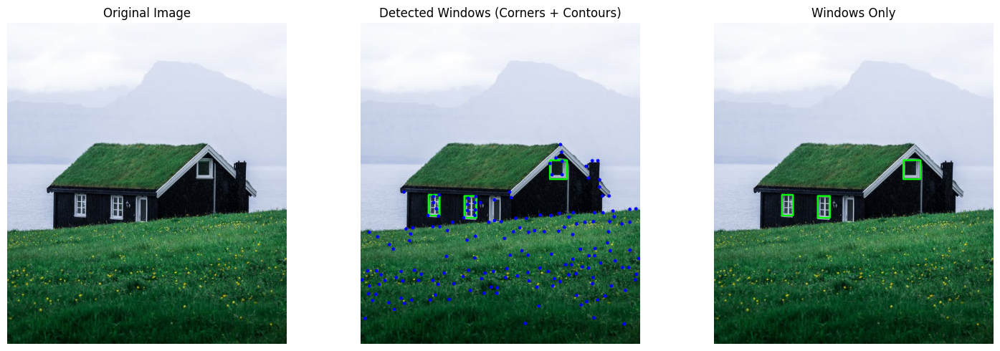

Number of windows detected: 3


In [ ]:
# apply binary threshold to isolate bright regions (windows are brighter than walls)
_, bright = cv2.threshold(img_6_gray, 100, 255, cv2.THRESH_BINARY)

# 1. morphological filtering

# define a small structuring element (3x3) for the morphological filters
kernel = np.ones((3, 3), np.uint8)

# 1.1 apply Morphological Opening to remove small noise like tiny dots
bright = cv2.morphologyEx(bright, cv2.MORPH_OPEN, kernel)

# 1.2 apply Morphological Closing to close small black holes/gaps inside white regions (useful to connect broken window edges, if any)
bright = cv2.morphologyEx(bright, cv2.MORPH_CLOSE, kernel)

# 1.3 apply morphological gradient to emphasize edges
# bright = cv2.morphologyEx(bright, cv2.MORPH_GRADIENT, kernel)

# 1.4 apply inRange to select only mid-level bright regions/windows to exclude very bright areas like the white roof edges and very dark regions like the walls
# (this helps to detect the window on the top of the roof)
bright = cv2.inRange(img_6_gray, 90, 165)

# corners from Harris detector from previous cell
#corners_harris_6_3 = np.argwhere(dst_dilated > 0.01 * dst_dilated.max())[:, [1, 0]]  # swap columns to (x, y)

# 2. contour detection
# (contours let us draw bounding boxes and filter potential windows by size and shape)
# find contours: locate the outer edges of the bright regions (these are candidate windows)
contours, _ = cv2.findContours(bright, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# prepare images for drawing results
windows_img = img_6.copy()          # image to draw corners + windows
windows_only_img = img_6.copy()     # image to draw only windows
detected_windows = []               # list to store detected windows

# 3. window detection loop
for cnt in contours:
  x, y, w, h = cv2.boundingRect(cnt)        # get bounding box for each contour
  area = cv2.contourArea(cnt)               # get area of contour

  # filter based on expected window size, area, and position
  if (8 < w < 100 and 8 < h < 100           # filter based on window's weight and height
      and 50 < area < 7000                  # area range
      and y < img_6.shape[0] * 0.98):       # reject very bottom (door)

    # count how many Shi-Tomasi corners from 6.3 are inside the bounding box
    corner_count = 0
    for corner in corners:
      cx, cy = corner.ravel()  # unpack (x, y) from Shi-Tomasi format
      if x <= cx <= x + w and y <= cy <= y + h:
        corner_count += 1

    # Harris version (commented)
    # for (cx, cy) in corners_harris_6_3:
    #   if x <= cx <= x + w and y <= cy <= y + h:
    #     corner_count += 1

    # keep bounding boxes with enough corners (windows typically have multiple corners, 4 in our case)
    if corner_count >= 4:
      cv2.rectangle(windows_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
      cv2.rectangle(windows_only_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
      detected_windows.append((x, y, w, h))

# display the results
plt.figure(figsize=(15, 5))

# original image
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img_6, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# corners and windows
plt.subplot(1, 3, 2)
corner_vis = windows_img.copy()
for corner in corners:
  cx, cy = corner.ravel()
  cv2.circle(corner_vis, (cx, cy), 3, (255, 0, 0), -1)  # draw Shi-Tomasi corners in blue
# Harris version (commented)
# for (cx, cy) in corners_harris_6_3:
#   cv2.circle(corner_vis, (cx, cy), 3, (0, 0, 255), -1)  # draw Harris corners in red
plt.imshow(cv2.cvtColor(corner_vis, cv2.COLOR_BGR2RGB))
plt.title(f'Detected Windows (Corners + Contours)')
plt.axis('off')

# only windows
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(windows_only_img, cv2.COLOR_BGR2RGB))
plt.title('Windows Only')
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Number of windows detected: {len(detected_windows)}")

As shown in the output images, the combined method effectively localizes the two main windows on the front of the house along with the window at the top of the roof. The detection of this window, which is successfully highlighted, demonstrates that the algorithm is sensitive to both standard and smaller windows, as long as they satisfy the brightness and corner density criteria. The final "Windows Only" image also avoids false positives from irrelevant regions, such as the grass or door, showing good selectivity. That said, slight fine-tuning of parameters, such as the corner count threshold, contour area range, or brightness filtering could help maintain reliable detection performance, especially when applied to images with different lighting conditions or building styles. Overall, the approach shows strong performance in isolating window structures by integrating corner-based clustering with morphological filtering and brightness segmentation, offering a robust framework for structured object detection tasks.

## Exercise 7. Angle Estimation and Image Combination for Billiard Scene

In this exercise, we work with a billiard scene to analyze and manipulate its main linear feature: the billiard cue.

We begin by loading and displaying the input image along with its rotated reference target for visual comparison.

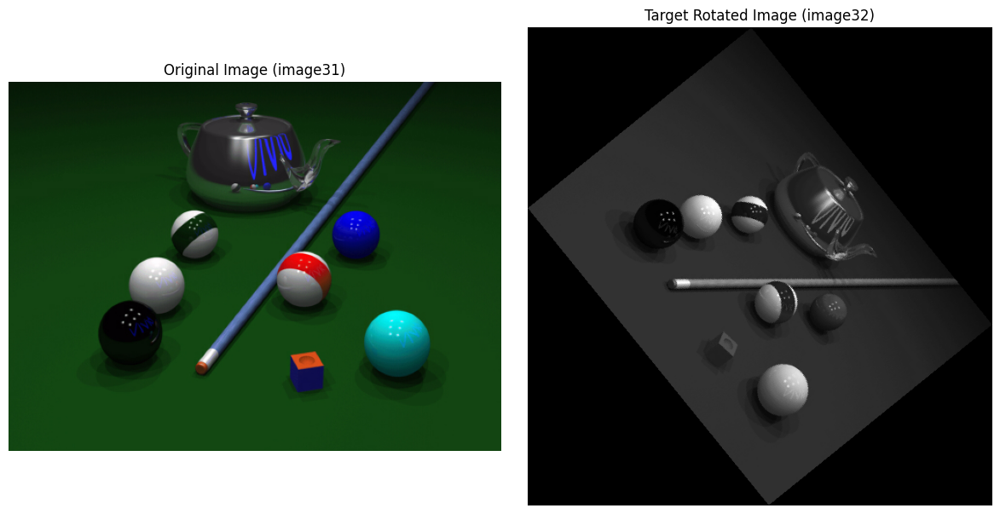

In [ ]:
# load the images
img31 = cv2.imread('image31.png')
img32 = cv2.imread('image32.png')

# display side by side
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img31)
plt.title('Original Image (image31)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img32)
plt.title('Target Rotated Image (image32)')
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# info of the two images
print("Image 1:")
print_image_info(img31)

print("\nImage 2:")
print_image_info(img32)

Image 1:
Image shape (height, width, channels): (383, 510, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 585990
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 255
Mean pixel value: 36.51
Standard deviation of pixel values: 35.96
Number of unique pixel values: 256

Image 2:
Image shape (height, width, channels): (638, 619, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 1184766
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 254
Mean pixel value: 22.81
Standard deviation of pixel values: 29.8
Number of unique pixel values: 255


### 7.1. Estimating the Billiard Cue Angle and Rotating the Image

We aim to estimate the angle of the billiard cue relative to the horizontal axis in image $31$. To achieve this, we first convert the image to grayscale and apply **Canny** edge detection to highlight object boundaries. We then use the **Hough Transform** to detect prominent straight lines, isolating the cue as it is the longest linear feature in the scene. By extracting the angle of this line, we compute the necessary rotation to align the cue horizontally. Finally, we rotate the image accordingly to visually verify the result against the provided reference image (image $32$).

Estimated cue angle: 39.00 degrees
Rotation needed: -51.00 degrees


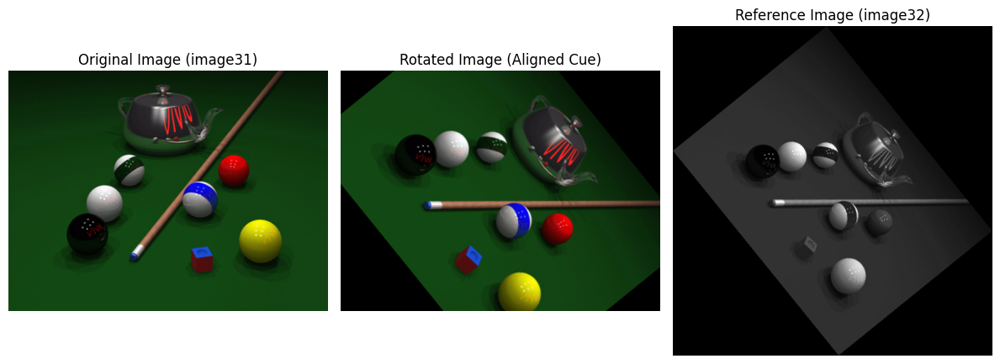

In [ ]:
# get the grayscale version of image31
gray31 = cv2.cvtColor(img31, cv2.COLOR_BGR2GRAY)

# apply Canny edge detection to highlight edges (needed for Hough transform)
edges = cv2.Canny(gray31, 50, 150, apertureSize=3)

# detect lines using HoughLines Transform: transforms edge points (from the Canny detector) into Hough space (rho, theta)
# - rho: perpedicular distance from the origin (top-left of the image) to the line rho = x*cos(theta) + y*sin(theta)
# - theta: angle (in radians) between the x-axis and the rho-line
# each edge pixel "votes" in an accumulator for all possible lines it could belong to and peaks in this accumulator correspond to strong straight lines in the image
# the billiard cue is the longest straight object in the scene, so it generates a clear peak in Hough space, making it easy to detect among all other structures
lines = cv2.HoughLines(edges, 1, np.pi / 180, 150)  # set the threshold=150 to focus on strong lines (we expect the cue to pass this easily)

# find the dominant angle (we'll take the first detected line with a high threshold)

# loop through all detected lines to collect their angles. Each 'line' is represented by (rho, theta) in Hough space
angles = []
for line in lines:
  rho, theta = line[0]
  angle = np.rad2deg(theta) # convert theta from radians to degrees for easier interpretation

  # filter out vertical (theta=0°) and horizontal (theta=90°) lines (we are only interested in diagonal lines, since the cue stick is the only long straight object at an angle!)
  if angle != 0 and angle != 90:
    angles.append(angle)

# calculate average angle for the cue (likely near 45°)
avg_angle = np.mean(angles)
rotation_angle = avg_angle - 90  # rotate avg_angle, so it's horizontal

print(f"Estimated cue angle: {avg_angle:.2f} degrees")
print(f"Rotation needed: {rotation_angle:.2f} degrees")

# rotate the image to align the cue horizontally
(h, w) = img31.shape[:2]    # get the image dimensions
center = (w // 2, h // 2)   # define the center of rotation (we rotate around the center of the image)

# compute the rotation matrix
M = cv2.getRotationMatrix2D(center, rotation_angle, 1.0)  # (1.0 means keep original size)

# apply the rotation to the image
rotated_img = cv2.warpAffine(img31, M, (w, h)) # (w, h): output size and same as original to maintain shape, but this causes cropping!

# display original, rotated and target images for comparison
plt.figure(figsize=(12, 6))

# original image
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img31, cv2.COLOR_BGR2RGB))
plt.title('Original Image (image31)')
plt.axis('off')

# rotated image
plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
plt.title('Rotated Image (Aligned Cue)')
plt.axis('off')

# target image
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(img32, cv2.COLOR_BGR2RGB))
plt.title('Reference Image (image32)')
plt.axis('off')

plt.tight_layout()
plt.show()

The estimated angle of the billiard cue is approximately $39°$ degrees, and after applying a rotation of about $-51°$ degrees, the cue becomes horizontally aligned, as visible in the rotated image. This closely matches the reference image (image $32$), verifying that both the angle estimation and the rotation are accurate and effective. Although some corners of the rotated image are cropped (a typical side effect of in-place rotation), this does not impact the alignment result. Such cropping could be avoided by expanding the canvas or padding the image before rotation if preserving the full scene were required.

### 7.2. Cue Isolation through Morphological and Contour Filtering

In this step, we focus on isolating the billiard cue stick from the rotated image (image $32$) by applying a structured pipeline of morphological operations, contour analysis, and mask refinement to generate an output closely matching the target reference (image $33$).

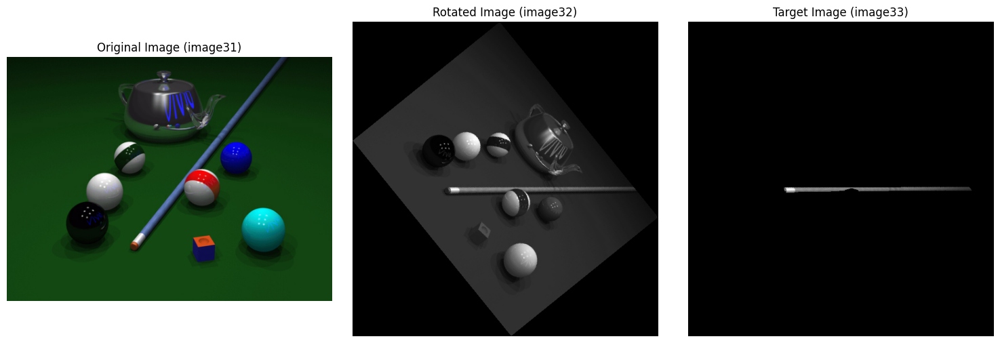

In [ ]:
# load image33
img33 = cv2.imread('image33.png')

# display the trhee images
plt.figure(figsize=(15, 5))

#  original image
plt.subplot(1, 3, 1)
plt.imshow(img31)
plt.title('Original Image (image31)')
plt.axis('off')

# rotated image
plt.subplot(1, 3, 2)
plt.imshow(img32)
plt.title('Rotated Image (image32)')
plt.axis('off')

# target image
plt.subplot(1, 3, 3)
plt.imshow(img33)
plt.title('Target Image (image33)')
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# a quick check of image's 33 info (see if it's also in RGB in other two images)
print_image_info(img33)

Image shape (height, width, channels): (638, 619, 3)
Number of dimensions: 3
Image type: RGB
Total number of elements (pixels x channels): 1184766
Data type of pixel values: uint8
Type of image object: <class 'numpy.ndarray'>

Minimum pixel value: 0
Maximum pixel value: 254
Mean pixel value: 0.81
Standard deviation of pixel values: 9.8
Number of unique pixel values: 192


**The Method: Isolating the Cue Stick from a Billiard Scene**

In this process, we aim to isolate the cue stick from a complex billiard scene containing balls, a teapot, and other visual elements. To achieve this, we apply a carefully designed image processing pipeline that separates the cue from the background and other objects using a combination of **thresholding, morphological operations, contour filtering, and mask manipulations** (alternatively, we could explore using methods like Canny edge detection combined with HoughLines for cue detection and HoughCircles for ball detection).

We begin by converting the grayscale input image into a binary image using a fixed threshold (**thresholding**), which clearly segments bright foreground objects (like the balls and cue) from the dark table background. Next, we apply morphological opening with a horizontal kernel. This step enhances thin, long horizontal shapes like the cue, while suppressing small or circular regions, helping us isolate the cue contour.

Separately, we apply morphological closing with a small elliptical kernel to enhance round, compact shapes in order to strengthen the ball regions by closing small gaps or imperfections. We then extract contours from both the cue-enhanced and ball-enhanced images. For the cue, we filter contours based on a high aspect ratio (width divided by height), since the cue is long and thin. For the balls, we filter contours based on near-unity aspect ratio and area, ensuring we only keep circular regions of meaningful size.

The critical step is when we **subtract** the balls mask from the cue mask. This is done using a bitwise AND between the cue mask and the inverse of the balls mask,  meaning, wherever the balls are detected, we remove those areas from the cue mask, ensuring we only keep pure cue pixels without overlapping ball regions. Finally, we apply the refined cue mask on the original image to extract the isolated cue stick and apply light smoothing to clean the edges.

This detailed, step-by-step approach allows us to effectively separate overlapping objects by exploiting their geometric and morphological differences, ultimately isolating the cue stick with high precision.

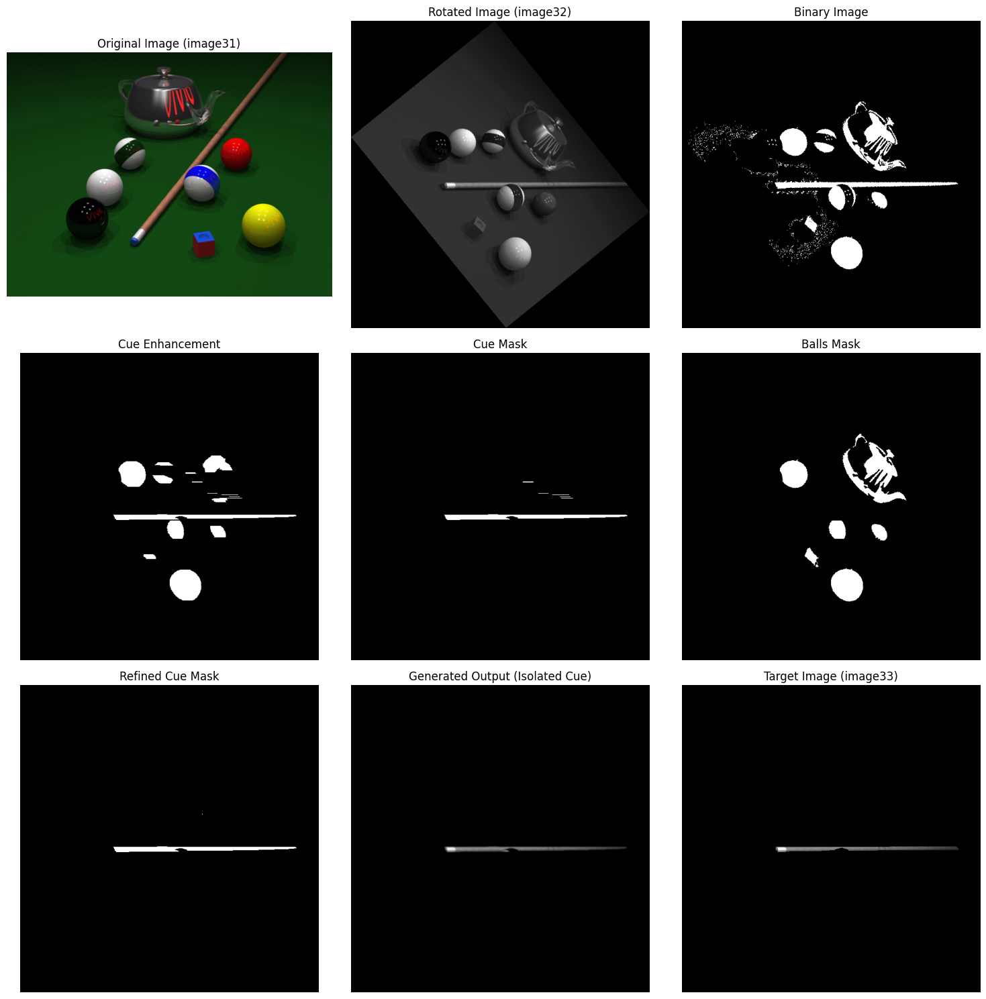

In [ ]:
# convert img32 grayscale (img31 is already form 7.1)
gray32 = cv2.cvtColor(img32, cv2.COLOR_BGR2GRAY)
gray33 = cv2.cvtColor(img33, cv2.COLOR_BGR2GRAY)

# 1. convert the grayscale image to binary by applying a fixed threshold (value 50 here) to segment bright distinct objects like cue and balls from the dark green table background
_, binary = cv2.threshold(gray32, 50, 255, cv2.THRESH_BINARY)

# 2. enhance horizontal structures by applying a morphological opening with a long horizontal kernel (1 pixel tall, 20 pixels wide) to keeps long, thin horizontal shapes like the cue and suppresses small or round objects
kernel_h = np.ones((1, 20), np.uint8)
cue_enhanced = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel_h)

# 3. find contours (connected components) in the cue-enhanced image
cue_contours, _ = cv2.findContours(cue_enhanced, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cue_mask = np.zeros_like(gray32)

# 4. detect the cue (iterate over the detected contours and filter by aspect ratio)
for cnt in cue_contours:
  x, y, w, h = cv2.boundingRect(cnt)
  aspect_ratio = w / h if h > 0 else 0  # aspect ratio= width / height, which is large for long, thin shapes, like the cue
  if aspect_ratio > 8:                  # at least 8 times wider than tall. Increasing it -> makes it stricter (only the very long cue kept). Lowering it -> makes it more permissive (might include shadows or other objects)
    cv2.drawContours(cue_mask, [cnt], -1, 255, -1)  # draw the cue in cue_mask image

# 5. enhance circular (or compact) structures by applying a morphological closing with a small circular (elliptical) kernel to merge small gaps in the ball regions and isolate them better
kernel_c = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
balls_enhanced = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel_c)

# find contours in the ball-enhanced image
balls_contours, _ = cv2.findContours(balls_enhanced, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)  # try cue_enhanced and compare results!

# 6. detect balls (iterate over the detected contours and filter by aspect ratio and area)

# contours on balls-enhanced image
balls_mask1 = np.zeros_like(gray32)
for cnt in balls_contours:    # from ball enhanced
  x, y, w, h = cv2.boundingRect(cnt)
  aspect_ratio = w / h if h > 0 else 0  # aspect_ratio ≈ 1 → circular shapes (width ≈ height)
  area = cv2.contourArea(cnt)           # area > 50 pixels → ignoring small noise or specks
  if 0.7 < aspect_ratio < 1.1 and area > 50:    # increasing aspect_ratio window (e.g. 0.7-6.3) will start picking up non-ball shapes or lowering the area captures larger objects or noise
    cv2.drawContours(balls_mask1, [cnt], -1, 255, -1)  # draw the balls in balls_mask image

# contours on cue-enhanced image (ensures all balls included)
balls_mask2 = np.zeros_like(gray32)
for cnt in cue_contours:   # from cue_enhanced
  x, y, w, h = cv2.boundingRect(cnt)
  aspect_ratio = w / h if h > 0 else 0
  area = cv2.contourArea(cnt)
  if 0.7 < aspect_ratio < 1.3 and area > 50:
    cv2.drawContours(balls_mask2, [cnt], -1, 255, -1)

# combine the two balls_masks to the final one
combined_balls_mask = cv2.bitwise_or(balls_mask1, balls_mask2)

# 7. subtract balls from cue mask by performing a bitwise AND between the cue mask and the inverse of the balls mask. This effectively removes in the cue mask wherever balls overlap
# (without this, the cue mask might still include merged parts of balls touching the cue and subtracting the ball regions ensures we isolate only the stick)
refined_cue_mask = cv2.bitwise_and(cue_mask, cv2.bitwise_not(combined_balls_mask))

# 8. extract the cue from the original (rotated) image by using the refined cue mask as a selector to extract only the cue pixels
output = cv2.bitwise_and(img32, img32, mask=refined_cue_mask)

# 9. apply Gaussian blur to slightly smooth the extracted cue and soften sharp edges.
output = cv2.GaussianBlur(output, (7, 7), 1)
output = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)  # convert for display


# display all intermediate steps + final results in a 3x3 grid
plt.figure(figsize=(15, 15))

# original image
plt.subplot(3, 3, 1)
plt.imshow(cv2.cvtColor(img31, cv2.COLOR_BGR2RGB))
plt.title('Original Image (image31)')
plt.axis('off')

# rotated image
plt.subplot(3, 3, 2)
plt.imshow(cv2.cvtColor(img32, cv2.COLOR_BGR2RGB))
plt.title('Rotated Image (image32)')
plt.axis('off')

# binary image
plt.subplot(3, 3, 3)
plt.imshow(binary, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

# cue enhancement image
plt.subplot(3, 3, 4)
plt.imshow(cue_enhanced, cmap='gray')
plt.title('Cue Enhancement')
plt.axis('off')

# cue mask
plt.subplot(3, 3, 5)
plt.imshow(cue_mask, cmap='gray')
plt.title('Cue Mask')
plt.axis('off')

# balls mask
plt.subplot(3, 3, 6)
plt.imshow(combined_balls_mask, cmap='gray')
plt.title('Balls Mask')
plt.axis('off')

# refined cue mask
plt.subplot(3, 3, 7)
plt.imshow(refined_cue_mask, cmap='gray')
plt.title('Refined Cue Mask')
plt.axis('off')

# generated output
plt.subplot(3, 3, 8)
plt.imshow(output)
plt.title('Generated Output (Isolated Cue)')
plt.axis('off')

# target output
plt.subplot(3, 3, 9)
plt.imshow(gray33, cmap='gray')
plt.title('Target Image (image33)')
plt.axis('off')

plt.tight_layout()
plt.show()

All the images shown, represent the full pipeline that generates the isolated cue stick. We start with the binary image, which separates the bright objects (balls, cue) from the dark background. Then, the cue enhancement image emphasizes long horizontal shapes, and the cue mask keeps only the cue based on its long aspect ratio. The balls mask is carefully built by combining two sources: one from the ball-enhanced image (catching compact round shapes) and one from the cue-enhanced image (to make sure we don't miss balls touching the cue). Through these steps, we refine the cue mask by subtracting out the detected balls, and finally, we extract the cue stick as the generated output.

As seen in the results, the generated output is very close to the target reference image. The only minor difference appears almost at the middle of the cue, where the ball meets the cue. With some extra fine-tuning, such as adjusting the aspect ratio limits, contour area thresholds, or the size of the morphological kernels, we could further improve the mask and achieve an almost perfect match to the target. Overall, the pipeline provides a strong and flexible method for separating overlapping objects in this kind of scene.

## Summary of Methods and Results

This section briefly recaps the key objectives, techniques, and outcomes of each exercise, highlighting the methods used and the main observations from the experiments.



*   **Exercise 1: Step Function Transformation**

  We applied a **custom step transformation** to a grayscale image, mapping continuous pixel intensity values into discrete ranges. This reduced the number of unique intensity levels and created clear, segmented zones of brightness. The result was an image with simplified tonal regions and enhanced edges, making structural features more visually distinct but less smooth and detailed.

*   **Exercise 2: Brightness and Color Enhancement**

  We enhanced both brightness and color to transform the dark forest RGB image into a clearer, more vibrant version. The key steps were:
    *   **Histogram analysis:** We examined the grayscale histogram and CDF to understand its low-light nature.
    *   **Brightness enhancement:** Applied histogram equalization in grayscale to improve overall visibility.
    *   **Color and contrast enhancement:** Used CLAHE on each RGB channel, testing different ```clipLimit``` values $(0.5, 2.5, 5.0)$ to enhance both color and local contrast.
  This process successfully improved the image's brightness and color, with moderate CLAHE settings (```clipLimit ≈ 2.5```) delivering the best balance between enhancement and natural appearance.

*   **Exercise 3: Brightness Enhancement with Gamma Correction**

  We used **gamma correction** to adjust the perceived brightness of a grayscale image. By applying different ```gamma``` values $(0.5, 1.5, 2.5)$, we observed how:
  *   Gamma $< 1$ brightened the image by enhancing darker regions.
  *   Gamma $> 1$ darkened the image by reducing overall brightness.
  *   Gamma $= 1$ left the image unchanged.
  A gamma value around $0.7$ provided the best improvement in brightness while maintaining a natural look.

*   **Exercise 4: Image Sharpening with Unsharp Masking**

  We sharpened a grayscale image of the moon using the **unsharp masking** technique, which emphasizes high-frequency details by subtracting a blurred version from the original. This enhanced edges and textures, making features like craters and surface patterns more pronounced. The method balanced clarity with a natural appearance, avoiding excessive noise or artifacts (we also experimented with the high boost method as an alternative sharpening approach).

*   **Exercise 5: Combined Spatial Enhancements**

  We investigated the transformation between two grayscale X-ray images:
    *   We built a **forward pipeline** starting from ```image_1``` and enhancing it step-by-step (complement, gamma correction, sharpening, brightness boost, and CLAHE) to approximate ```image_2```.
    *   We also designed a **reverse pipeline** to transform ```image_2``` back to ```image_1```, using a combination of complement, gamma correction, brightness adjustments, and blurring.
  These pipelines demonstrated how sequential spatial enhancement methods can effectively approximate complex transformations between medical images.

*   **Exercise 6: Edge, Line, Corner, and Window Detection**

  We performed multi-step analysis on a house image to extract structural features:
    *   a. We applied edge detection techniques like Sobel, Laplacian, and Canny to highlight key contours such as the house's rooflines, walls, and windows. The **Canny Detector** provided the cleanest and sharpest results, capturing fine architectural details with minimal noise.
    *   We estimated the angle of the roof's diagonal edges using the **Hough Line Transform**, successfully detecting straight lines and calculating an average roof angle of $~43°$, closely matching the actual visual slope.
    *   We detected prominent corners using **Harris Detector** and **Shi-Tomasi Detector**. Shi-Tomasi yielded cleaner, more precise corner points (especially around windows and roof edges), while Harris provided a denser set of corner responses.
    *   Finally, we localized the windows by combining the corner detection results from the previous question with **brightness-based segmentation** and **morphological filtering**. By integrating **contours** and **corner clustering**, we robustly detected the main windows, including the small  window at the top of the roof when conditions allowed. This hybrid pipeline demonstrated the effectiveness of blending intensity-based segmentation with geometric cues to achieve precise window localization.
  Overall, this exercise showcased a full workflow for structural analysis of a building, combining classic computer vision techniques, edges, lines, corners, and region-based filtering, into a well integrated detection pipeline.

*   **Exercise 7: Cue Angle Estimation and Object Segmentation**

  *   a. We first estimated the cue's angle relative to the orizontal axis in the original image using **Canny edge detection** and the **Hough Line Transform**, isolating the longest straight line in the scene. We calculated the rotation needed to horizontally align the cue and applied it to the image, verifying the result against the rotated reference image (image $32$).
  *   b. Using the rotated image, we applied a combination of binary **thresholding, morphological filtering** (opening for cue, closing for balls), and **contour-based selection** based on aspect ratio and area to build separate cue and ball masks. We then refined the cue mask by subtracting the ball mask, isolating the cue stick. The pipeline achieved a strong match to the target reference (image $33$), with only a minor difference at the ball-cue overlap edge.

Overall, this notebook demonstrates a rich set of classical image processing techniques, covering tasks such as enhancement, sharpening, segmentation, geometric detection, and object isolation. We also show that achieving optimal results often requires combining multiple methods and fine-tuning their parameters to suit the specific image context. Together, these foundational approaches create a solid stepping stone toward exploring more advanced solutions, including machine learning and deep learning, for deeper image understanding and analysis